<a href="https://colab.research.google.com/github/Shirley-Dongxx/APS360_project/blob/main/project_trial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project trials


## Data Loading



In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!tar -xf  '/content/gdrive/MyDrive/APS360_project/new_crop.tar.gz' -C '/content/gdrive/MyDrive/APS360_project/new_crop_img'

In [ ]:
from datetime import datetime, timedelta
from scipy.io import loadmat
import numpy as np
import pandas as pd
import scipy
import os
import imghdr
import matplotlib.pyplot as plt
import itertools
import math

from collections import defaultdict
from pprint import pprint
from shutil import copy2

import cv2
import sys
from google.colab.patches import cv2_imshow

from sklearn.model_selection import train_test_split

In [ ]:
def get_age_label(age):
    if 0 <= age <= 5:
        label = 0
    elif 6 <= age <= 10:
        label = 1
    elif 11 <= age <= 15:
        label = 2
    elif 16 <= age <= 20:
        label = 3
    elif 21 <= age <= 30:
        label = 4
    elif 31 <= age <= 40:
        label = 5
    elif 41 <= age <= 50:
        label = 6
    elif 51 <= age <= 60:
        label = 7
    elif 61 <= age <= 70:
        label = 8
    else:
        label = 9

    return label

In [ ]:
# get the gender of the image
def get_gender(gender):
    if(gender == 1.0):
      return "female"
    else:
      return "male"

In [ ]:
DATA_SAVE_PATH = "/content/gdrive/MyDrive/APS360_project/new_crop_img/cropped"

In [ ]:
# create the file paths
if not os.path.isdir(DATA_SAVE_PATH):
    print("Path ", DATA_SAVE_PATH, "has not formed")
    os.mkdir(DATA_SAVE_PATH)

if not os.path.isdir(DATA_SAVE_PATH+"/train"):
    print("Path ", DATA_SAVE_PATH+"/train", "has not formed")
    os.mkdir(DATA_SAVE_PATH+"/train")

if not os.path.isdir(DATA_SAVE_PATH+"/train/female"):
    print("Path ", DATA_SAVE_PATH+"/train/female", "has not formed")
    os.mkdir(DATA_SAVE_PATH+"/train/female")

if not os.path.isdir(DATA_SAVE_PATH+"/train/male"):
    print("Path ", DATA_SAVE_PATH+"/train/male", "has not formed")
    os.mkdir(DATA_SAVE_PATH+"/train/male")

for k in range(10):

    if not os.path.isdir(DATA_SAVE_PATH+"/train/female/"+str(k)):
      print("Path ", DATA_SAVE_PATH+"/train/female/"+str(k), "has not formed")
      os.mkdir(DATA_SAVE_PATH+"/train/female/"+str(k))

    if not os.path.isdir(DATA_SAVE_PATH+"/train/male/"+str(k)):
      print("Path ", DATA_SAVE_PATH+"/train/male/"+str(k), "has not formed")
      os.mkdir(DATA_SAVE_PATH+"/train/male/"+str(k))

Path  /content/gdrive/MyDrive/APS360_project/new_crop_img/cropped has not formed
Path  /content/gdrive/MyDrive/APS360_project/new_crop_img/cropped/train has not formed
Path  /content/gdrive/MyDrive/APS360_project/new_crop_img/cropped/train/female has not formed
Path  /content/gdrive/MyDrive/APS360_project/new_crop_img/cropped/train/male has not formed
Path  /content/gdrive/MyDrive/APS360_project/new_crop_img/cropped/train/female/0 has not formed
Path  /content/gdrive/MyDrive/APS360_project/new_crop_img/cropped/train/male/0 has not formed
Path  /content/gdrive/MyDrive/APS360_project/new_crop_img/cropped/train/female/1 has not formed
Path  /content/gdrive/MyDrive/APS360_project/new_crop_img/cropped/train/male/1 has not formed
Path  /content/gdrive/MyDrive/APS360_project/new_crop_img/cropped/train/female/2 has not formed
Path  /content/gdrive/MyDrive/APS360_project/new_crop_img/cropped/train/male/2 has not formed
Path  /content/gdrive/MyDrive/APS360_project/new_crop_img/cropped/train/fema

In [ ]:
import glob

In [ ]:
files = glob.glob(f"/content/gdrive/MyDrive/APS360_project/new_crop_img/crop_part1")
n = 0
for file in files:  
  n += 1
  print(file)
  if (n>5):
    break

/content/gdrive/MyDrive/APS360_project/new_crop_img/crop_part1


In [ ]:
n = 0
for filename in os.listdir("/content/gdrive/MyDrive/APS360_project/new_crop_img/crop_part1"):
    n += 1
    if filename.endswith("jpg"): 
        # Your code comes here such as
        print(filename) 
        print(filename.split('_')[0])
        print(int(filename.split('_')[1]))
        #data.append(filename)
    if n>5:
      break

57_1_0_20170108225103840.jpg.chip.jpg
57
1
32_1_4_20170105164252747.jpg.chip.jpg
32
1
50_0_3_20170111222312455.jpg.chip.jpg
50
0
51_0_2_20170104212459757.jpg.chip.jpg
51
0
43_0_0_20170104210217699.jpg.chip.jpg
43
0
16_1_0_20170102234708483.jpg.chip.jpg
16
1


In [ ]:
test_age_count = [0,0,0,0,0,0,0,0,0,0]
test_gender_count = [0,0]

In [ ]:
def print_age_distribution(age_count):
  fig = plt.figure()
  ax = fig.add_axes([0,0,1,1])
  age_label = ["0-5","6-10","11-15","16-20","21-30","31-40","41-50","51-60","61-70","71+"]
  count_label = age_count
  ax.plot(age_label,count_label)
  plt.show()

def print_gender_distribution(gender_count):
  fig = plt.figure()
  ax = fig.add_axes([0,0,1,1])
  gender_label = ["female", "male"]
  count_label = gender_count
  ax.bar(gender_label,count_label)
  plt.show()

In [ ]:
n = 0
for filename in os.listdir("/content/gdrive/MyDrive/APS360_project/new_crop_img/crop_part1"):
    n += 1
    age = filename.split('_')[0]
    age_label = get_age_label(int(age))
    test_age_count[age_label] += 1
    age_label = str(age_label)

    gender = filename.split('_')[1]
    gender_label = get_gender(float(gender))
    test_gender_count[1-int(gender)] += 1

    new_file_path = DATA_SAVE_PATH + "/train/"+ gender_label + "/" + age_label +"/" + filename
    print("The new file path is:", new_file_path)
    full_path = "/content/gdrive/MyDrive/APS360_project/new_crop_img/crop_part1/" + filename

    copy2(full_path, new_file_path)
    print("n=", n)


The gender distribution is: 


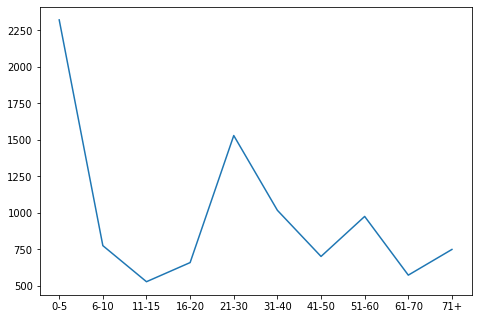

The age distribution is:


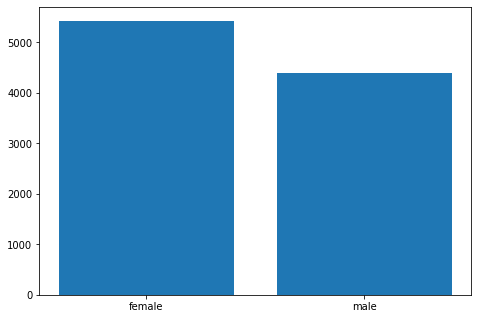

In [ ]:
print("The gender distribution is: ")
print_age_distribution(test_age_count)

print("The age distribution is:")
print_gender_distribution(test_gender_count)

## CAAE


In [ ]:
# import modules
import numpy as np
import time
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torch.utils.data.sampler import SubsetRandomSampler
import torchvision.transforms as transforms
import torchvision.utils as vutils

from torchvision import datasets, models, transforms
from torch.utils.data import TensorDataset
from torch.autograd import Variable

import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

In [ ]:
batch_size = 32
#transform = transforms.Compose([transforms.Resize((224, 224)),
                                #transforms.ToTensor(),
                                #transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

In [ ]:
batch_size = 32
transform = transforms.Compose([transforms.Resize((224, 224)),
                                transforms.ToTensor()])

In [ ]:
# data loading

# define the classes?
classes = ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']

In [ ]:
train_path = "/content/gdrive/MyDrive/APS360_project/new_crop_img/cropped/train"
train_data_male = torchvision.datasets.ImageFolder(root = train_path+"/male", transform = transform)
train_data_female = torchvision.datasets.ImageFolder(root = train_path+"/female", transform = transform)

In [ ]:
train_loader_female = torch.utils.data.DataLoader(train_data_female, batch_size=batch_size,
                                                num_workers=1, shuffle = True)
train_loader_male = torch.utils.data.DataLoader(train_data_male, batch_size=batch_size,
                                                num_workers=1, shuffle = True)

(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)


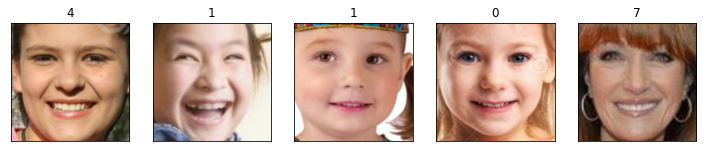

In [ ]:
#display some of the images
fig = plt.figure(figsize=(25,4))
for i, (images, labels) in enumerate(train_loader_female):
  images = images.numpy()
  if (i<1):
    for idx in range(5):
      print(images[idx].shape)
      ax = fig.add_subplot(1, 20/2, idx+1, xticks = [], yticks = [])
      plt.imshow(np.transpose(images[idx], (1,2,0)))
      ax.set_title(classes[labels[idx]])
  else:
    break

In [ ]:
img_size=224 #256x256x3? #tried 224*224


In [ ]:
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder,self).__init__()
        self.conv = nn.Sequential(
            
            #hulu input: 128x128x3 --> 64x64x64 --> 32x32x128 --> 16x16x256-->8x8x512
            #our input: 224x224x3 --> 112x112x64 --> 56x56x128 -->28x28x256 --> 14x14x512

            #conv1
            nn.Conv2d(in_channels = 3, out_channels = 64,kernel_size=5,stride=2,padding=2),
            nn.ReLU(),
            #conv2
            nn.Conv2d(64,128,kernel_size=5,stride=2,padding=2),
            nn.ReLU(),
            #conv3
            nn.Conv2d(128,256,kernel_size=5,stride=2,padding=2),
            nn.ReLU(),
            #conv4
            nn.Conv2d(256,512,kernel_size=5,stride=2,padding=2),
            nn.ReLU(),
        )
        self.fc = nn.Linear(14*14*512,50)
        
    def forward(self,x):
        conv = self.conv(x).view(-1,14*14*512)
        out = self.fc(conv)
        return out

In [ ]:
 class Generator(nn.Module):
    def __init__(self):
        super(Generator,self).__init__()
        self.fc = nn.Sequential(nn.Linear(50+10*5+25,
                                          14*14*1024),
                                nn.ReLU())
        self.upconv= nn.Sequential(
            #hulu input: 8x8x1024 --> 16x16x512 --> 32x32x256 --> 64x64x128 --> 128x128x64-->128x128x3
            #our input: 14x14x1024 --> 28x28x512 --> 56x56x256 --> 112x112x128 --> 224x224x64-->224x224x3
            
            #deconv1
            nn.ConvTranspose2d(1024,512,4,2,1),
            nn.ReLU(),
            #deconv2
            nn.ConvTranspose2d(512,256,4,2,1),
            nn.ReLU(),
            #deconv3
            nn.ConvTranspose2d(256,128,4,2,1),
            nn.ReLU(),
            #deconv4
            nn.ConvTranspose2d(128,64,4,2,1),
            nn.ReLU(),
            
            #output face
            nn.ConvTranspose2d(64,3,3,1,1),
            nn.Tanh(),
        )
        
    def forward(self,z,age,gender):
        l = age.repeat(1,5).float()
        k = gender.view(-1,1).repeat(1,25)
        
        x = torch.cat([z,l,k],dim=1)
        fc = self.fc(x).view(-1,1024,14,14)
        out = self.upconv(fc)
        return out

In [ ]:
class DiscriminatorZ(nn.Module):
    def __init__(self):
        super(DiscriminatorZ,self).__init__()
        self.model = nn.Sequential(
            #64->32->16
            #FC1
            nn.Linear(50,64),
            nn.ReLU(),
            #FC2
            nn.Linear(64,32),
            nn.ReLU(),
            #FC3
            nn.Linear(32,16),
            nn.ReLU(),
            #FC4
            nn.Linear(16,1),
            nn.Sigmoid()
        )
    def forward(self,z):
        return self.model(z)

In [ ]:
class DiscriminatorImage(nn.Module):
    def __init__(self):
        super(DiscriminatorImage,self).__init__()
        self.conv_img = nn.Sequential(
            nn.Conv2d(3,16,4,2,1),
        )
        self.conv_l = nn.Sequential(
            nn.ConvTranspose2d(10*5+25, 10*5+25, 112, 1, 0),
            #nn.ConvTranspose2d(10*5+25, 10*5+25, 64, 1, 0),
            nn.ReLU()
        )
        self.total_conv = nn.Sequential(
            nn.Conv2d(16+10*5+25,32,4,2,1),
            nn.ReLU(),
            
            nn.Conv2d(32,64,4,2,1),
            nn.ReLU(),
            
            nn.Conv2d(64,224,4,2,1),
            nn.ReLU()
        )
        self.fc_common = nn.Sequential(
            nn.Linear(14*14*224,1024),
            nn.ReLU()
        )
        self.fc_head1 = nn.Sequential(
            nn.Linear(1024,1),
            nn.Sigmoid()
        )
        self.fc_head2 = nn.Sequential(
            nn.Linear(1024,10),
            nn.Softmax()
        )
        
    def forward(self,img,age,gender):
        l = age.repeat(1,5,1,1,)
        k = gender.repeat(1,25,1,1,)
        conv_img = self.conv_img(img)
        conv_l   = self.conv_l(torch.cat([l,k],dim=1))
        catted   = torch.cat((conv_img,conv_l),dim=1) #32x91x112x112
        total_conv = self.total_conv(catted).view(-1,14*14*224)
        body = self.fc_common(total_conv)
        
        head1 = self.fc_head1(body)
        head2 = self.fc_head2(body)
        
        return head1,head2

In [ ]:
def one_hot_encode(label , batchSize , n_l):
    oneHot = - torch.ones(batchSize*n_l).view(batchSize,n_l)
    for i,j in enumerate(label):
        oneHot[i,j] = 1
    #To Enable GPU Usage
    if use_cuda and torch.cuda.is_available():
      return oneHot.cuda()
    return oneHot

In [ ]:
def TV_LOSS(imgTensor,img_size=224):
    x = (imgTensor[:,:,1:,:]-imgTensor[:,:,:img_size-1,:])**2
    y = (imgTensor[:,:,:,1:]-imgTensor[:,:,:,:img_size-1])**2

    out = (x.mean(dim=2)+y.mean(dim=3)).mean()
    return out

In [ ]:
use_cuda = True

if use_cuda and torch.cuda.is_available():
  print('CUDA is available!  Training on GPU ...')
else:
  print('CUDA is not available.  Training on CPU ...')

CUDA is available!  Training on GPU ...


In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1 or classname.find("Linear") !=-1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [ ]:
def train_v3(E, G, Dz, Dimg, train_data, valid_data, batch_size, num_epochs=5, learning_rate=1e-5, gender = 1): #gender = 1 represents male, =0 represents female
    torch.manual_seed(42)

    #############################################
    #To Enable GPU Usage
    if use_cuda and torch.cuda.is_available():
        E=E.cuda()
        G=G.cuda()
        Dz=Dz.cuda()
        Dimg=Dimg.cuda()
    #############################################
    if use_cuda:
      criterion_bce = nn.BCEWithLogitsLoss().cuda()
      criterion_l1  = nn.L1Loss().cuda()
      criterion = nn.CrossEntropyLoss().cuda()
      #MSE = nn.MSELoss().cuda()
    else:
      criterion_bce = nn.BCEWithLogitsLoss()
      criterion_l1  = nn.L1Loss()
      criterion = nn.CrossEntropyLoss()
      #MSE = nn.MSELoss()
    #define the criterion and optimizers
    '''
    criterion = nn.CrossEntropyLoss()
    criterion_l1 = nn.L1Loss()
    criterion_bce = nn.BCELoss()
    '''


    E.apply(weights_init)
    Dimg.apply(weights_init)
    Dz.apply(weights_init)
    G.apply(weights_init)

    E_optimizer = torch.optim.Adam(E.parameters(), lr=learning_rate,betas=(0.5,0.999)) # for encoder
    G_optimizer = torch.optim.Adam(G.parameters(), lr=learning_rate,betas=(0.5,0.999)) # for generator
    dimg_optimizer = torch.optim.Adam(Dz.parameters(), lr=learning_rate,betas=(0.5,0.999)) # for image discriminator
    dz_optimizer = torch.optim.Adam(Dimg.parameters(), lr=learning_rate,betas=(0.5,0.999)) # for z discrminator

    # record the losses and accuracy
    #train_loss_male,train_loss_female, valid_loss_male,valid_loss_female =  [], [], [], []
    #train_acc_male, train_acc_female, valid_acc_male, valid_acc_female = [], [], [], []
    epochs, train_losses, val_losses, train_acc, val_acc = [], [], [], [], []
    G_losses_1, G_losses_2, Dimg_losses, Dz_losses, z_losses, D_img_real_losses = [],[],[],[],[],[]

    E_acc_train, G_acc_train, Dz_acc_train, Dimg_acc_train=[],[],[],[]
    E_acc_val, G_acc_val, Dz_acc_val, Dimg_acc_val=[],[],[],[]
    
    print("Training start:")
    start_time = time.time()

    # keep track of loss and generated, "fake" samples
    samples = []
    losses = []
    img_list = []

    # fixed data for testing
    sample_size = 32
    rand_size = 50
    fixed_noise = np.random.uniform(-1, 1, size=(sample_size, rand_size))
    fixed_noise = torch.from_numpy(fixed_noise).float()

    
    fixed_l = -torch.ones(32*10).view(32,10)
    for i,l in enumerate(fixed_l):
        l[i//8] = 1

    #############################################
    #To Enable GPU Usage
    if use_cuda and torch.cuda.is_available():
        fixed_noise = fixed_noise.cuda()
        fixed_l = fixed_l.cuda()
    #############################################

    for epoch in range(num_epochs):

        #Dimg.train()
        #Dz.train()

        for i,(real_imgs, labels) in enumerate(train_data):
            #print("working on i=",i)
            batch_size = real_imgs.size(0)

            if (gender == 1):
                img_gender = torch.ones(batch_size).view(-1,1)
            else:
                img_gender = torch.zeros(batch_size).view(-1,1)

            if epoch == 0 and i == 0:
                fixed_noise = real_imgs[:8].repeat(4,1,1,1)
                fixed_gender = img_gender[:8].view(-1,1).repeat(4,1)

            
            # rescale images to range -1 to 1
            real_imgs = real_imgs*2 - 1

            # one-hot encode the age labels
            age_onehot = one_hot_encode(labels,batch_size,10) # there is a total of 10 different age labels

            z_star = np.random.uniform(-1, 1, size=(batch_size, rand_size))
            z_star = torch.from_numpy(z_star).float()
            real_label = torch.ones(batch_size).view(-1,1)
            fake_label = torch.zeros(batch_size).view(-1,1)

            #############################################
            #To Enable GPU Usage
            if use_cuda and torch.cuda.is_available():
              real_imgs = real_imgs.cuda()
              labels = labels.cuda()
              criterion = criterion.cuda()
              criterion_l1 = criterion_l1.cuda()
              criterion_bce = criterion_bce.cuda()
              fixed_gender = fixed_gender.cuda()
              z_star = z_star.cuda()
              fake_label = fake_label.cuda()
              real_label = real_label.cuda()
              img_gender = img_gender.cuda()
            #############################################

            #=== Train the Encoder and Generator ===
            #E.zero_grad()
            #G.zero_grad()

            z = E(real_imgs)
            
            recon = G(z, age_onehot, img_gender) #reconstruct based on age and gender
            G_loss_1 = criterion_l1(recon, real_imgs)

            # find out the loss on image discriminator using encoder

            z = E(real_imgs)
            recon = G(z, age_onehot, img_gender) #reconstruct based on age and gender
            D_recon,_ = Dimg(recon,age_onehot.view(batch_size,10,1,1),img_gender.view(batch_size,1,1,1))
            Dimg_real_loss = criterion_bce(D_recon, real_label)

            # find out the loss on z discriminator using encoder
            #Dz.zero_grad()
            Dz_prior = Dz(z_star)
            Dz_now = Dz(z)
            z_loss = criterion_bce(Dz_now, real_label)

            recon = G(z.detach(),age_onehot,img_gender)
            G_loss_2 = TV_LOSS(recon)

            # propogate back
            present_loss = G_loss_1 + 0.0001*Dimg_real_loss + 0.1*z_loss + G_loss_2
            present_loss.backward()
            E_optimizer.step()
            G_optimizer.step()
            E_optimizer.zero_grad()
            G_optimizer.zero_grad()

            # === Train the z Discriminator ===
            #Dz.zero_grad()
            Dz_prior = Dz(z_star)
            Dz_now = Dz(z.detach())
            Dz_loss = criterion_bce(Dz_prior,real_label) + criterion_bce(Dz_now,fake_label) #find out the total loss

            # propogate back
            Dz_loss.backward()
            dz_optimizer.step()
            dz_optimizer.zero_grad()

            # === Train the image Discriminator ===
            #Dimg.zero_grad()
            D_img_real,D_clf = Dimg(real_imgs,age_onehot.view(batch_size,10,1,1),img_gender.view(batch_size,1,1,1))
            D_img_fake,_ = Dimg(recon.detach(),age_onehot.view(batch_size,10,1,1),img_gender.view(batch_size,1,1,1))

            Dimg_loss = criterion_bce(D_img_real,real_label) + criterion_bce(D_img_fake,fake_label)
            Dimg_loss.backward()
            dimg_optimizer.step()
            dimg_optimizer.zero_grad()

        G_losses_1.append(float(G_loss_1)/batch_size)
        G_losses_2.append(float(G_loss_2)/batch_size)
        Dimg_losses.append(float(Dimg_loss)/batch_size)

        Dz_losses.append(float(Dz_loss)/batch_size)
        z_losses.append(float(z_loss)/batch_size)
        D_img_real_losses.append(float(Dimg_real_loss)/batch_size)

        # Check how the generator is doing by saving G's output on fixed_noise
        with torch.no_grad():
            if use_cuda and torch.cuda.is_available():
                fixed_noise = fixed_noise.cuda()
                fixed_z = E(fixed_noise)
                fixed_z = fixed_z.cuda()
                fake = G(fixed_z, fixed_l, fixed_gender).detach().cpu()
                img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            else:
                fake = G(fixed_noise, fixed_l, fixed_gender).detach().cpu()
                img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        epochs.append(epoch)
        
        print(("Epoch {}: G_losses_1: {:.4f} | G_losses_2: {:.4f} | Dimg_losses: {:.4f} | Dz_losses: {:.4f} | z_losses: {:.4f} | D_img_real_losses: {:.4f}").format(
                   epoch + 1,G_losses_1[-1], G_losses_2[-1], Dimg_losses[-1], Dz_losses[-1], z_losses[-1], D_img_real_losses[-1]))

    print('Finished Training')
    end_time = time.time()
    elapsed_time = end_time - start_time
    print("Total time elapsed: {:.5f} seconds".format(elapsed_time))

    # plot
    plt.title("Training Curve")
    
    plt.plot(Dimg_losses, label="Dimg")
    plt.plot(Dz_losses, label="Dz")
    plt.plot(z_losses, label="z_encoder")
    plt.plot(D_img_real_losses, label="img_encoder")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend(loc='best')
    plt.show()

    plt.title("Training Curve")
    plt.plot(G_losses_1, label="G_loss_1")
    plt.plot(G_losses_2, label="G_loss_2")
    plt.xlabel("Iterations")
    plt.ylabel("Training Loss")
    plt.legend(loc='best')

    return img_list

Training start:


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:119: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Epoch 1: G_losses_1: 0.0192 | G_losses_2: 0.0000 | Dimg_losses: 0.0379 | Dz_losses: 0.0409 | z_losses: 0.0198 | D_img_real_losses: 0.0224
Epoch 2: G_losses_1: 0.0168 | G_losses_2: 0.0000 | Dimg_losses: 0.0325 | Dz_losses: 0.0414 | z_losses: 0.0186 | D_img_real_losses: 0.0224
Epoch 3: G_losses_1: 0.0189 | G_losses_2: 0.0000 | Dimg_losses: 0.0325 | Dz_losses: 0.0457 | z_losses: 0.0173 | D_img_real_losses: 0.0224
Epoch 4: G_losses_1: 0.0206 | G_losses_2: 0.0000 | Dimg_losses: 0.0525 | Dz_losses: 0.0462 | z_losses: 0.0179 | D_img_real_losses: 0.0101
Epoch 5: G_losses_1: 0.0170 | G_losses_2: 0.0000 | Dimg_losses: 0.0525 | Dz_losses: 0.0435 | z_losses: 0.0189 | D_img_real_losses: 0.0101
Epoch 6: G_losses_1: 0.0179 | G_losses_2: 0.0000 | Dimg_losses: 0.0525 | Dz_losses: 0.0454 | z_losses: 0.0180 | D_img_real_losses: 0.0101
Epoch 7: G_losses_1: 0.0177 | G_losses_2: 0.0000 | Dimg_losses: 0.0525 | Dz_losses: 0.0434 | z_losses: 0.0191 | D_img_real_losses: 0.0101
Epoch 8: G_losses_1: 0.0165 | G_lo

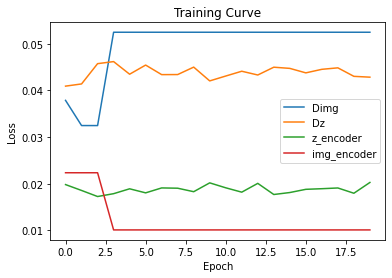

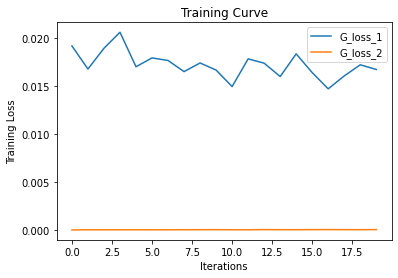

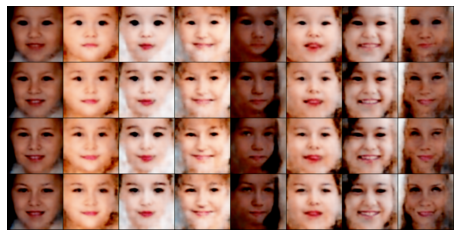

In [ ]:
E_female = Encoder()
G_female = Generator()
Dimg_female = DiscriminatorImage()
Dz_female = DiscriminatorZ()

img_list = train_v3(E_female, G_female, Dz_female, Dimg_female, train_loader_female, train_loader_female,
         batch_size=32, num_epochs=20, learning_rate=0.0005, gender = 0)
  
# capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

Training start:


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/container.py:119: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Epoch 1: G_losses_1: 0.0063 | G_losses_2: 0.0000 | Dimg_losses: 0.0447 | Dz_losses: 0.0392 | z_losses: 0.0206 | D_img_real_losses: 0.0224
Epoch 2: G_losses_1: 0.0054 | G_losses_2: 0.0000 | Dimg_losses: 0.0447 | Dz_losses: 0.0396 | z_losses: 0.0205 | D_img_real_losses: 0.0224
Epoch 3: G_losses_1: 0.0053 | G_losses_2: 0.0000 | Dimg_losses: 0.0447 | Dz_losses: 0.0440 | z_losses: 0.0190 | D_img_real_losses: 0.0224
Epoch 4: G_losses_1: 0.0051 | G_losses_2: 0.0000 | Dimg_losses: 0.0447 | Dz_losses: 0.0430 | z_losses: 0.0195 | D_img_real_losses: 0.0224
Epoch 5: G_losses_1: 0.0049 | G_losses_2: 0.0000 | Dimg_losses: 0.0447 | Dz_losses: 0.0428 | z_losses: 0.0204 | D_img_real_losses: 0.0224
Finished Training
Total time elapsed: 1694.27136 seconds


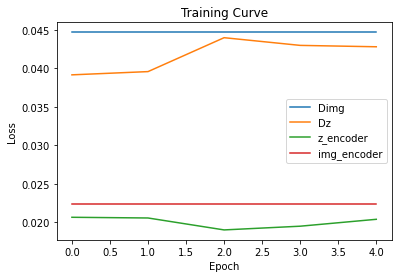

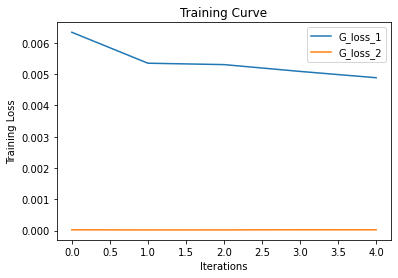

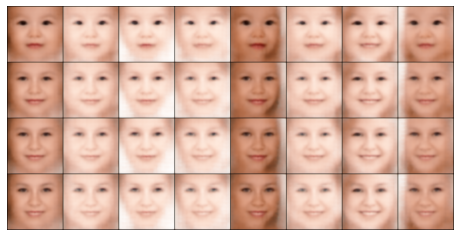

In [ ]:
E_female2 = Encoder()
G_female2 = Generator()
Dimg_female2 = DiscriminatorImage()
Dz_female2 = DiscriminatorZ()

img_list = train_v3(E_female2, G_female2, Dz_female2, Dimg_female2, train_loader_female, train_loader_female,
         batch_size=32, num_epochs=5, learning_rate=0.0005, gender = 0)
  
# capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [ ]:
batch_size = 32
transform2 = transforms.Compose([transforms.Resize((224, 224)),
                                transforms.CenterCrop((135,135)),
                                transforms.Resize((224, 224)),
                                transforms.ToTensor()])

In [ ]:
train_path = '/content/gdrive/MyDrive/APS360_project/wiki_processed/train'
test_path = '/content/gdrive/MyDrive/APS360_project/wiki_processed/test'
validation_path = "/content/gdrive/MyDrive/APS360_project/wiki_processed/validation"

#load the image folders
train_data_female2 = torchvision.datasets.ImageFolder(root = train_path+"/female", transform = transform2)
test_data_female2 = torchvision.datasets.ImageFolder(root = test_path+"/female", transform = transform2)
validation_data_female2 = torchvision.datasets.ImageFolder(root = validation_path+"/female", transform = transform2)

In [ ]:
test_loader_female2 = torch.utils.data.DataLoader(test_data_female2, batch_size=batch_size,
                                                num_workers=1, shuffle = True)
validation_loader_female2 = torch.utils.data.DataLoader(validation_data_female2, batch_size=batch_size,
                                                num_workers=1, shuffle = True)

In [ ]:
def inverse_normalize(tensor, mean, std):
    for t, m, s in zip(tensor, mean, std):
        t.mul_(s).add_(m)
    return tensor

tensor([5, 4, 4, 1, 4, 8, 3, 6, 6, 4, 4, 4, 7, 4, 6, 4, 3, 5, 7, 8, 5, 5, 4, 5,
        5, 5, 5, 5, 4, 5, 4, 3])
tensor([3, 3, 3, 1, 3, 5, 2, 4, 4, 3, 3, 3, 4, 3, 4, 3, 2, 3, 4, 5, 3, 3, 3, 3,
        3, 3, 3, 3, 3, 3, 3, 2])
torch.Size([32, 50])
torch.Size([32, 1])
torch.Size([32])


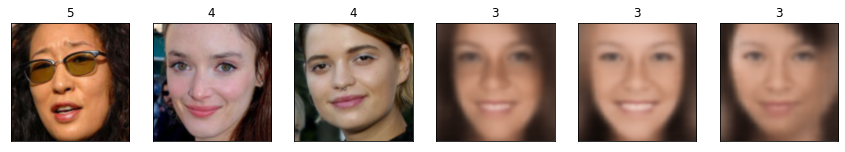

In [ ]:
#display some of the images
fig = plt.figure(figsize=(25,4))

for i, (images, labels) in enumerate(test_loader_female2):
  if (i<1):
      images = images*2 - 1
      images = images.cuda()
      img_en = E_female2(images)
      new_labels = []
      print(labels)
      for label in labels:
        new_labels.append(int(label.item()/2)+1)

      new_labels = torch.tensor(new_labels)
      print(new_labels)
      age_onehot = one_hot_encode(new_labels,batch_size,10)
      img_gender = torch.zeros(batch_size).view(-1,1)
      img_gender = img_gender.cuda()
      print(img_en.shape)
      print(img_gender.shape)
      print(labels.shape)
      img_gen = G_female2(img_en, age_onehot, img_gender)

      inv_normalize = transforms.Normalize(mean=[-0.5/0.5, -0.5/0.5, -0.5/0.5],std=[1/0.5, 1/0.5, 1/0.5])
      images = images.cpu()
      img_gen = img_gen.detach().cpu()


      #images= inverse_normalize(tensor=images, mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
      #img_gen= inverse_normalize(tensor=img_gen, mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
      #img_gen = inv_normalize(img_gen)

      images = images.numpy()
      images = (images+1)/2
      img_gen = img_gen.numpy()
      img_gen = (img_gen+1)/2

      for idx in range(3):
          ax = fig.add_subplot(1, 20/2, idx+1, xticks = [], yticks = [])
          plt.imshow(np.transpose(images[idx], (1,2,0)))
          ax.set_title(classes[labels[idx]])
          #print(img_gen[idx].shape)
          ax = fig.add_subplot(1, 20/2, idx+4, xticks = [], yticks = [])
          plt.imshow(np.transpose(img_gen[idx], (1,2,0)))
          ax.set_title(classes[new_labels[idx]])
  else:
    break

tensor([5, 0, 4, 8, 2, 9, 4, 4, 9, 1, 7, 3, 7, 7, 0, 3, 4, 9, 1, 6, 7, 5, 4, 3,
        5, 7, 1, 2, 0, 5, 5, 9])
tensor([3, 1, 3, 5, 2, 5, 3, 3, 5, 1, 4, 2, 4, 4, 1, 2, 3, 5, 1, 4, 4, 3, 3, 2,
        3, 4, 1, 2, 1, 3, 3, 5])


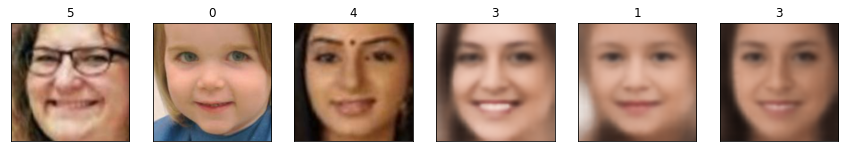

In [ ]:
#display some of the images
fig = plt.figure(figsize=(25,4))

for i, (images, labels) in enumerate(train_loader_female):
  if (i<1):
      images = images*2 - 1
      images = images.cuda()
      img_en = E_female2(images)
      new_labels = []
      print(labels)
      for label in labels:
        new_labels.append(int(label.item()/2)+1)

      new_labels = torch.tensor(new_labels)
      print(new_labels)
      age_onehot = one_hot_encode(new_labels,batch_size,10)
      img_gender = torch.zeros(batch_size).view(-1,1)
      img_gender = img_gender.cuda()

      img_gen = G_female2(img_en, age_onehot, img_gender)

      #inv_normalize = transforms.Normalize(mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],std=[1/0.229, 1/0.224, 1/0.255])
      images = images.cpu()
      img_gen = img_gen.detach().cpu()


      #images= inverse_normalize(tensor=images, mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
      #img_gen= inverse_normalize(tensor=img_gen, mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
      #img_gen = inv_normalize(img_gen)

      images = images.numpy()
      images = (images+1)/2
      img_gen = img_gen.numpy()
      img_gen = (img_gen+1)/2

      for idx in range(3):
          ax = fig.add_subplot(1, 20/2, idx+1, xticks = [], yticks = [])
          plt.imshow(np.transpose(images[idx], (1,2,0)))
          ax.set_title(classes[labels[idx]])
          #print(img_gen[idx].shape)
          ax = fig.add_subplot(1, 20/2, idx+4, xticks = [], yticks = [])
          plt.imshow(np.transpose(img_gen[idx], (1,2,0)))
          ax.set_title(classes[new_labels[idx]])
  else:
    break

In [ ]:
#hulu with UTK image 64x64x3, need mogai
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seem for reproducibility
manualSeed = 999
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 32

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 20

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1
# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

"""###Dataloader"""
transform = transforms.Compose([transforms.Resize((64, 64)),
                                transforms.ToTensor()])

train_path = "/content/gdrive/MyDrive/APS360_project/new_crop_img/cropped/train"
train_data_male = torchvision.datasets.ImageFolder(root = train_path+"/male", transform = transform)
train_data_female = torchvision.datasets.ImageFolder(root = train_path+"/female", transform = transform)

train_loader_female = torch.utils.data.DataLoader(train_data_female, batch_size=batch_size,
                                                num_workers=1, shuffle = True)
dataloader = torch.utils.data.DataLoader(train_data_male, batch_size=batch_size,
                                                num_workers=1, shuffle = True)

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

"""###Weight initialization"""

# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

"""###GAN Model"""

# Generator Code
class Generator(nn.Module):
    def __init__(self, ngpu, nz, nc, ngf):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)
      
# Discriminator Code      
class Discriminator(nn.Module):
    def __init__(self, ngpu, nc, ndf):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

"""###Training"""

def train_GAN(netG, netD,dataloader, lr, beta1, num_epochs, batch_size, device):
  # Initialize BCELoss function
  criterion = nn.BCELoss()

  # Create batch of latent vectors that we will use to visualize
  #  the progression of the generator
  fixed_noise = torch.randn(64, nz, 1, 1, device=device)

  # Establish convention for real and fake labels during training
  real_label = 1
  fake_label = 0

  # Setup Adam optimizers for both G and D
  optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
  optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))
  # Training Loop


  # Lists to keep track of progress
  img_list = []
  G_losses = []
  D_losses = []
  iters = 0

  print("Starting Training Loop...")
  # For each epoch
  for epoch in range(num_epochs):
      print(epoch)
      # For each batch in the dataloader
      for i, data in enumerate(dataloader, 0):

          ############################
          # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
          ###########################
          ## Train with all-real batch
          netD.zero_grad()
          # Format batch
          real_cpu = data[0].to(device)
          b_size = real_cpu.size(0)
          label = torch.full((b_size,), real_label, device=device, dtype=torch.float)
          # Forward pass real batch through D
          output = netD(real_cpu).view(-1)
          # Calculate loss on all-real batch
          errD_real = criterion(output, label)
          # Calculate gradients for D in backward pass
          errD_real.backward()
          D_x = output.mean().item()

          ## Train with all-fake batch
          # Generate batch of latent vectors
          noise = torch.randn(b_size, nz, 1, 1, device=device)
          # Generate fake image batch with G
          fake = netG(noise)
          label.fill_(fake_label)
          # Classify all fake batch with D
          output = netD(fake.detach()).view(-1)
          # Calculate D's loss on the all-fake batch
          errD_fake = criterion(output, label)
          # Calculate the gradients for this batch
          errD_fake.backward()
          D_G_z1 = output.mean().item()
          # Add the gradients from the all-real and all-fake batches
          errD = errD_real + errD_fake
          # Update D
          optimizerD.step()

          ############################
          # (2) Update G network: maximize log(D(G(z)))
          ###########################
          netG.zero_grad()
          label.fill_(real_label)  # fake labels are real for generator cost
          # Since we just updated D, perform another forward pass of all-fake batch through D
          output = netD(fake).view(-1)
          # Calculate G's loss based on this output
          errG = criterion(output, label)
          # Calculate gradients for G
          errG.backward()
          D_G_z2 = output.mean().item()
          # Update G
          optimizerG.step()

          # Output training stats
         
          # Save Losses for plotting later
          G_losses.append(errG.item())
          D_losses.append(errD.item())

          # Check how the generator is doing by saving G's output on fixed_noise
          if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
              with torch.no_grad():
                  fake = netG(fixed_noise).detach().cpu()
              img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

          iters += 1
          
  # ploting loss functions
  plt.figure(figsize=(10,5))
  plt.title("Generator and Discriminator Loss During Training")
  plt.plot(G_losses,label="G")
  plt.plot(D_losses,label="D")
  plt.xlabel("iterations")
  plt.ylabel("Loss")
  plt.legend()
  plt.show()
  
  return img_list

# Create the generator
netG = Generator(ngpu, nz, nc, ngf).to(device)

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Create the Discriminator
netD = Discriminator(ngpu, nc, ndf).to(device)

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)


# training 
img_list = train_GAN(netG, netD,dataloader, lr, beta1, num_epochs, batch_size, device)

# capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-9],(1,2,0)))
plt.show()

Random Seed:  999


NameError: ignored

## GAN

In [2]:
# import modules
import numpy as np
import time
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torch.utils.data.sampler import SubsetRandomSampler
import torchvision.transforms as transforms
import torchvision.utils as vutils

from torchvision import datasets, models, transforms
from torch.utils.data import TensorDataset
from torch.autograd import Variable

import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

In [ ]:
batch_size = 32
utk_transform = transforms.Compose([transforms.Resize((224, 224)),
                                transforms.ToTensor()])

In [ ]:
# data loading

# define the classes?
classes = ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']

In [17]:
utk_train_path = "/content/gdrive/MyDrive/APS360_project/new_crop_img/cropped/train"
utk_train_data_male = torchvision.datasets.ImageFolder(root = utk_train_path+"/male", transform = utk_transform)
utk_train_data_female = torchvision.datasets.ImageFolder(root = utk_train_path+"/female", transform = utk_transform)

print(len(utk_train_data_female))
print(len(utk_train_data_male))

8006
6710


In [20]:
#split a small testing set
utk_test_female, utk_train_female = torch.utils.data.random_split(utk_train_data_female, [2006, 6000], generator=torch.Generator().manual_seed(15))
utk_test_male, utk_train_male = torch.utils.data.random_split(utk_train_data_male, [2710, 4000], generator=torch.Generator().manual_seed(61))

utk_test_loader_female = torch.utils.data.DataLoader(utk_test_female, batch_size=batch_size,
                                                num_workers=1, shuffle = True)
utk_test_loader_male = torch.utils.data.DataLoader(utk_test_male, batch_size=batch_size,
                                                num_workers=1, shuffle = True)
utk_train_loader_female = torch.utils.data.DataLoader(utk_train_female, batch_size=batch_size,
                                                num_workers=1, shuffle = True)
utk_train_loader_male = torch.utils.data.DataLoader(utk_train_male, batch_size=batch_size,
                                                num_workers=1, shuffle = True)

In [21]:
train_total = utk_train_male + utk_train_female

In [22]:
utk_train_loader = torch.utils.data.DataLoader(train_total, batch_size=batch_size,
                                                num_workers=2, shuffle = True)

In [ ]:
DATA_SAVE_PATH = "/content/gdrive/MyDrive/APS360_project/new_crop_img/GAN_cropped"
# create the file paths
if not os.path.isdir(DATA_SAVE_PATH):
    print("Path ", DATA_SAVE_PATH, "has not formed")
    os.mkdir(DATA_SAVE_PATH)

if not os.path.isdir(DATA_SAVE_PATH+"/train"):
    print("Path ", DATA_SAVE_PATH+"/train", "has not formed")
    os.mkdir(DATA_SAVE_PATH+"/train")

if not os.path.isdir(DATA_SAVE_PATH+"/train/A"):
    print("Path ", DATA_SAVE_PATH+"/train/A", "has not formed")
    os.mkdir(DATA_SAVE_PATH+"/train/A")

if not os.path.isdir(DATA_SAVE_PATH+"/train/B"):
    print("Path ", DATA_SAVE_PATH+"/train/B", "has not formed")
    os.mkdir(DATA_SAVE_PATH+"/train/B")

Path  /content/gdrive/MyDrive/APS360_project/new_crop_img/GAN_cropped/train has not formed
Path  /content/gdrive/MyDrive/APS360_project/new_crop_img/GAN_cropped/train/A has not formed
Path  /content/gdrive/MyDrive/APS360_project/new_crop_img/GAN_cropped/train/B has not formed


In [ ]:
n = 0
for filename in os.listdir("/content/gdrive/MyDrive/APS360_project/new_crop_img/crop_part1"):
    age = filename.split('_')[0]
    age_label = int(age)
    n += 1
    #test_age_count[age_label] += 1
    #age_label = str(age_label)

    if ( 0 <= age_label <= 40):
      new_file_path = DATA_SAVE_PATH + "/train/A/"+ filename
    else:
      new_file_path = DATA_SAVE_PATH + "/train/B/"+ filename
    
    #new_file_path = DATA_SAVE_PATH + "/train/"+ gender_label + "/" + age_label +"/" + filename
    if n%200 == 0:
      print("n=",n)
      print("The new file path is:", new_file_path)
    full_path = "/content/gdrive/MyDrive/APS360_project/new_crop_img/crop_part1/" + filename

    copy2(full_path, new_file_path)
    #print("n=", n)


In [14]:
import itertools

#import pytorch_lightning as pl
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.utils import make_grid

In [19]:
batch_size = 16
#utk_transform = transforms.Compose([transforms.Resize((224, 224)),
                                #transforms.ToTensor()])

In [12]:
utk_transform = transforms.Compose([
            transforms.RandomHorizontalFlip(),
            transforms.Resize((224 + 30, 224 + 30)),
            transforms.RandomCrop(224),
            transforms.ToTensor()#,
            #transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
        ])

In [ ]:
utk_train_path = "/content/gdrive/MyDrive/APS360_project/new_crop_img/GAN_cropped/train"
utk_train_data = torchvision.datasets.ImageFolder(root = utk_train_path, transform = utk_transform)

In [ ]:
print("length=",len(utk_train_data))

length= 9780


In [ ]:
utk_test, utk_train = torch.utils.data.random_split(utk_train_data, [5780, 4000], generator=torch.Generator().manual_seed(25))

In [ ]:
utk_test_loader = torch.utils.data.DataLoader(utk_test, batch_size=batch_size,
                                                num_workers=2, shuffle = True)
utk_train_loader = torch.utils.data.DataLoader(utk_train, batch_size=batch_size,
                                                num_workers=2, shuffle = True)

In [6]:
use_cuda = True

if use_cuda and torch.cuda.is_available():
  print('CUDA is available!  Training on GPU ...')
else:
  print('CUDA is not available.  Training on CPU ...')

CUDA is available!  Training on GPU ...


In [7]:
# Data configs
domainA_dir = '/content/gdrive/MyDrive/APS360_project/new_crop_img/GAN_cropped/train/A'
domainB_dir = '/content/gdrive/MyDrive/APS360_project/new_crop_img/GAN_cropped/train/B'

# Network Configs
ngf = 32
ndf = 32
n_blocks = 9

# Loss configs:
adv_weight = 2
cycle_weight = 10
identity_weight = 7

# Optimizer configs:
lr = 0.0001
weight_decay = 0.0001

# Training configs:
img_size = 224
batch_size = 32
num_workers = 2
epochs = 5

In [8]:
class ResidualBlock(nn.Module):
    def __init__(self, in_features):
        super(ResidualBlock, self).__init__()

        conv_block = [nn.ReflectionPad2d(1),
                      nn.Conv2d(in_features, in_features, 3),
                      nn.BatchNorm2d(in_features),
                      nn.ReLU(),
                      nn.ReflectionPad2d(1),
                      nn.Conv2d(in_features, in_features, 3),
                      nn.BatchNorm2d(in_features)]

        self.conv_block = nn.Sequential(*conv_block)

    def forward(self, x):
        return x + self.conv_block(x)


class Generator(nn.Module):
    def __init__(self, ngf, n_residual_blocks=3):
        super(Generator, self).__init__()

        # Initial convolution block
        model = [nn.ReflectionPad2d(3),
                 nn.Conv2d(3, ngf, 7),
                 nn.BatchNorm2d(ngf),
                 nn.ReLU()]

        # Downsampling
        in_features = ngf
        out_features = in_features * 2
        for _ in range(2):
            model += [nn.Conv2d(in_features, out_features, 3, stride=2, padding=1),
                      nn.BatchNorm2d(out_features),
                      nn.ReLU()]
            in_features = out_features
            out_features = in_features * 2

        # Residual blocks
        for _ in range(n_residual_blocks):
            model += [ResidualBlock(in_features)]

        # Upsampling
        out_features = in_features // 2
        for _ in range(2):
            model += [nn.ConvTranspose2d(in_features, out_features, 3, stride=2, padding=1, output_padding=1),
                      nn.BatchNorm2d(out_features),
                      nn.ReLU()]
            in_features = out_features
            out_features = in_features // 2

        # Output layer
        model += [nn.ReflectionPad2d(3),
                  nn.Conv2d(ngf, 3, 7),
                  nn.Tanh()]

        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)


class Discriminator(nn.Module):
    def __init__(self, ndf):
        super(Discriminator, self).__init__()

        # A bunch of convolutions one after another
        model = [nn.Conv2d(3, ndf, 4, stride=2, padding=1),
                 nn.LeakyReLU(0.2, inplace=True)]

        model += [nn.Conv2d(ndf, ndf * 2, 4, stride=2, padding=1),
                  nn.BatchNorm2d(ndf * 2),
                  nn.LeakyReLU(0.2, inplace=True)]

        model += [nn.Conv2d(ndf * 2, ndf * 4, 4, stride=2, padding=1),
                  nn.InstanceNorm2d(ndf * 4),
                  nn.LeakyReLU(0.2, inplace=True)]

        model += [nn.Conv2d(ndf * 4, ndf * 8, 4, padding=1),
                  nn.InstanceNorm2d(ndf * 8),
                  nn.LeakyReLU(0.2, inplace=True)]

        # FCN classification layer
        model += [nn.Conv2d(ndf * 8, 1, 4, padding=1)]

        self.model = nn.Sequential(*model)

    def forward(self, x):
        x = self.model(x)
        # Average pooling and flatten
        return F.avg_pool2d(x, x.size()[2:]).view(x.size()[0], -1)

In [ ]:
def train_GAN(G_A2B, G_B2A, D_A, D_B, train_data, lr=0.0001, num_epochs=5, batch_size=32):

    #############################################
    #To Enable GPU Usage
    if use_cuda and torch.cuda.is_available():
        G_A2B = G_A2B.cuda()
        G_B2A = G_B2A.cuda()
        D_A = D_A.cuda()
        D_B = D_B.cuda()
    #############################################

    # Initialize BCELoss function
    criterion_BCE = nn.BCELoss()
    criterion_L1 = nn.L1Loss()
    criterion_MSE = nn.MSELoss()

    #############################################
    #To Enable GPU Usage
    if use_cuda and torch.cuda.is_available():
        criterion_BCE = criterion_BCE.cuda()
        criterion_L1 = criterion_L1.cuda()
        criterion_MSE = criterion_MSE.cuda()
    #############################################

    epochs, G_losses, D_losses = [],[],[]
    img_list_A, img_list_B = [],[]

    # Create batch of latent vectors that we will use to visualize
    #  the progression of the generator
    fixed_noise = torch.randn(ngf, 50, 1, 1)

    # Setup Adam optimizers for both G and D
    optimizer_G = optim.Adam(itertools.chain(G_A2B.parameters(), G_B2A.parameters()), lr=lr, betas=(0.5, 0.999))
    optimizer_D = optim.Adam(itertools.chain(D_A.parameters(), D_B.parameters()), lr=lr, betas=(0.5, 0.999))

    print("Training start:")
    start_time = time.time()

    for epoch in range(num_epochs):
        for i,(real_imgs, labels) in enumerate(train_data):
            real_A, real_B = [],[]
            idx_A, idx_B = [],[]

            # rescale images to range -1 to 1
            real_imgs = real_imgs*2 - 1
            
            idx = 0
            for label in labels:
                #print(label.item())
                if (label.item()==0):
                  idx_A.append(idx)
                else:
                  idx_B.append(idx)
                idx += 1

            if(len(idx_A)==0 or len(idx_B)==0):
              continue

            for idx in idx_A:
              real_A.append(real_imgs[idx].numpy())
            
            for idx in idx_B:
              real_B.append(real_imgs[idx].numpy())

            real_A = torch.tensor(real_A)
            real_B = torch.tensor(real_B)

            #print(real_A.shape)
            #print(real_B.shape)

            #############################################
            #To Enable GPU Usage
            if use_cuda and torch.cuda.is_available():
                real_A = real_A.cuda()
                real_B = real_B.cuda()
            #############################################

            same_B = G_A2B(real_B)
            loss_identity_B = criterion_L1(same_B, real_B) * identity_weight

            # G_B2A(A) should equal A if real A is fed
            same_A = G_B2A(real_A)
            loss_identity_A = criterion_L1(same_A, real_A) * identity_weight

            # GAN loss
            fake_B = G_A2B(real_A)
            pred_fake_B = D_B(fake_B)
            loss_GAN_A2B = criterion_MSE(pred_fake_B, torch.ones(pred_fake_B.shape).type_as(pred_fake_B)) * adv_weight

            fake_A = G_B2A(real_B)
            pred_fake_A = D_A(fake_A)
            loss_GAN_B2A = criterion_MSE(pred_fake_A, torch.ones(pred_fake_A.shape).type_as(pred_fake_A)) * adv_weight

            # Cycle loss
            recovered_A = G_B2A(fake_B)
            loss_cycle_ABA = criterion_L1(recovered_A, real_A) * cycle_weight

            recovered_B = G_A2B(fake_A)
            loss_cycle_BAB = criterion_L1(recovered_B, real_B) * cycle_weight

            # Total loss
            g_loss = loss_identity_A + loss_identity_B + loss_GAN_A2B + loss_GAN_B2A + loss_cycle_ABA + loss_cycle_BAB
            g_loss.backward()
            optimizer_G.step()
            optimizer_G.zero_grad()

            # Real loss
            pred_real = D_A(real_A)
            loss_D_real = criterion_MSE(pred_real, torch.ones(pred_real.shape).type_as(pred_real))

            # Fake loss
            pred_fake_A = D_A(fake_A.detach())
            loss_D_fake = criterion_MSE(pred_fake_A, torch.zeros(pred_fake_A.shape).type_as(pred_fake_A))

            # Total loss
            loss_D_A = (loss_D_real + loss_D_fake) * 0.5

            # Real loss
            pred_real = D_B(real_B)
            loss_D_real = criterion_MSE(pred_real, torch.ones(pred_real.shape).type_as(pred_real))

            # Fake loss
            pred_fake_B = D_B(fake_B.detach())
            loss_D_fake = criterion_MSE(pred_fake_B, torch.zeros(pred_fake_B.shape).type_as(pred_fake_B))

            # Total loss
            loss_D_B = (loss_D_real + loss_D_fake) * 0.5
            d_loss = loss_D_A + loss_D_B
            d_loss.backward()
            optimizer_D.step()
            optimizer_D.zero_grad()
        
        epochs.append(epoch)
        G_losses.append(g_loss/32)
        D_losses.append(d_loss/32)

        print(("Epoch {}: G_losses: {:.4f} | D_losses: {:.4f}").format(epoch + 1,G_losses[-1], D_losses[-1]))

        with torch.no_grad():
            if use_cuda and torch.cuda.is_available():
                #fixed_noise.cuda()
                fake_A = fake_A.detach().cpu()
                fake_B = fake_B.detach().cpu()
                img_list_A.append(vutils.make_grid(fake_A, padding=2, normalize=True))
                img_list_B.append(vutils.make_grid(fake_A, padding=2, normalize=True))
            else:
                fake_A = fake_A.detach()
                fake_B = fake_B.detach()
                img_list_A.append(vutils.make_grid(fake_A, padding=2, normalize=True))
                img_list_B.append(vutils.make_grid(fake_A, padding=2, normalize=True))

    print('Finished Training')
    end_time = time.time()
    elapsed_time = end_time - start_time
    print("Total time elapsed: {:.5f} seconds".format(elapsed_time))

    plt.title("Training Curve")
    plt.plot(G_losses, label="G_loss")
    plt.plot(D_losses, label="D_loss")
    plt.xlabel("Iterations")
    plt.ylabel("Training Loss")
    plt.legend(loc='best')
    plt.show()

    return img_list_A, img_list_B

In [ ]:
# create the models 
genA2B = Generator(ngf, n_residual_blocks=2)
genB2A = Generator(ngf, n_residual_blocks=2)
disGA = Discriminator(ndf)
disGB = Discriminator(ndf)

In [ ]:
# create the models 
genA2Bz = Generator(ngf, n_residual_blocks=0)
genB2Az = Generator(ngf, n_residual_blocks=0)
disGAz = Discriminator(ndf)
disGBz = Discriminator(ndf)

Training start:
Epoch 1: G_losses: 0.0555 | D_losses: 0.0203
Epoch 2: G_losses: 0.0575 | D_losses: 0.0213
Epoch 3: G_losses: 0.0383 | D_losses: 0.0205
Epoch 4: G_losses: 0.0499 | D_losses: 0.0207
Epoch 5: G_losses: 0.0542 | D_losses: 0.0211
Epoch 6: G_losses: 0.0640 | D_losses: 0.0206
Epoch 7: G_losses: 0.0616 | D_losses: 0.0210
Epoch 8: G_losses: 0.0623 | D_losses: 0.0206
Epoch 9: G_losses: 0.0576 | D_losses: 0.0210
Epoch 10: G_losses: 0.0812 | D_losses: 0.0217
Epoch 11: G_losses: 0.0451 | D_losses: 0.0225
Epoch 12: G_losses: 0.0418 | D_losses: 0.0209
Epoch 13: G_losses: 0.0571 | D_losses: 0.0209
Epoch 14: G_losses: 0.0506 | D_losses: 0.0209
Epoch 15: G_losses: 0.0431 | D_losses: 0.0212
Epoch 16: G_losses: 0.0559 | D_losses: 0.0211
Epoch 17: G_losses: 0.0502 | D_losses: 0.0217
Epoch 18: G_losses: 0.0432 | D_losses: 0.0207
Epoch 19: G_losses: 0.0608 | D_losses: 0.0207
Epoch 20: G_losses: 0.0487 | D_losses: 0.0216
Finished Training
Total time elapsed: 4889.87052 seconds


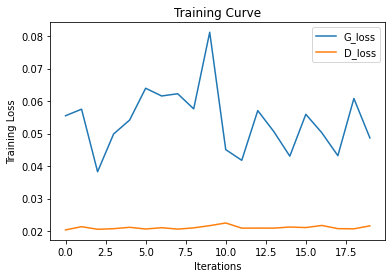

In [ ]:
#train_GAN(G_A2B, G_B2A, D_A, D_B, train_data, lr=0.0001, num_epochs=5, batch_size=32
img_list_Az, img_list_Bz = train_GAN(genA2Bz, genB2Az, disGAz, disGBz, utk_train_loader, lr=0.0001, num_epochs = 20, batch_size = 32)

In [ ]:
# create the models 
genA2Bo = Generator(ngf, n_residual_blocks=4)
genB2Ao = Generator(ngf, n_residual_blocks=4)
disGAo = Discriminator(ndf)
disGBo = Discriminator(ndf)

Training start:
Epoch 1: G_losses: 0.1061 | D_losses: 0.0220
Epoch 2: G_losses: 0.0875 | D_losses: 0.0223
Epoch 3: G_losses: 0.0495 | D_losses: 0.0205
Epoch 4: G_losses: 0.0640 | D_losses: 0.0208
Epoch 5: G_losses: 0.0470 | D_losses: 0.0223
Epoch 6: G_losses: 0.0509 | D_losses: 0.0207
Epoch 7: G_losses: 0.0729 | D_losses: 0.0220
Epoch 8: G_losses: 0.0672 | D_losses: 0.0207
Epoch 9: G_losses: 0.0456 | D_losses: 0.0214
Epoch 10: G_losses: 0.0386 | D_losses: 0.0217
Finished Training
Total time elapsed: 2866.31624 seconds


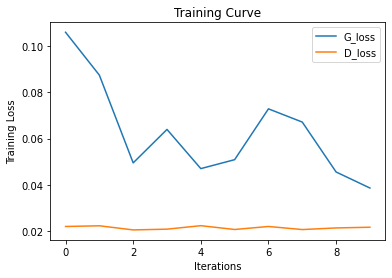

In [ ]:
#train_GAN(G_A2B, G_B2A, D_A, D_B, train_data, lr=0.0001, num_epochs=5, batch_size=32
img_list_A, img_list_B = train_GAN(genA2Bo, genB2Ao, disGAo, disGBo, utk_train_loader, lr=0.0002, num_epochs = 10, batch_size = 32)

Training start:
Epoch 1: G_losses: 0.1055 | D_losses: 0.0231
Epoch 2: G_losses: 0.2141 | D_losses: 0.0213
Epoch 3: G_losses: 0.1728 | D_losses: 0.0207
Epoch 4: G_losses: 0.0835 | D_losses: 0.0222
Epoch 5: G_losses: 0.1400 | D_losses: 0.0216
Epoch 6: G_losses: 0.0928 | D_losses: 0.0222
Epoch 7: G_losses: 0.0873 | D_losses: 0.0224
Finished Training
Total time elapsed: 3860.77286 seconds


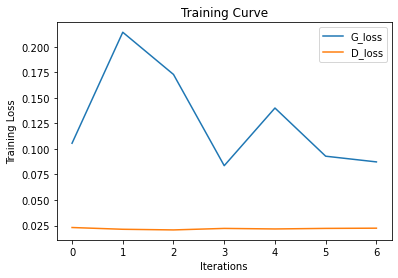

In [ ]:
#train_GAN(G_A2B, G_B2A, D_A, D_B, train_data, lr=0.0001, num_epochs=5, batch_size=32
img_list_A, img_list_B = train_GAN(genA2B, genB2A, disGA, disGB, utk_train_loader, lr=0.0001, num_epochs = 7, batch_size = 32)

Training start:
Epoch 1: G_losses: 0.0929 | D_losses: 0.0213
Epoch 2: G_losses: 0.1186 | D_losses: 0.0206
Epoch 3: G_losses: 0.0604 | D_losses: 0.0199
Epoch 4: G_losses: 0.1021 | D_losses: 0.0244
Epoch 5: G_losses: 0.0738 | D_losses: 0.0203
Epoch 6: G_losses: 0.0669 | D_losses: 0.0226
Epoch 7: G_losses: 0.0948 | D_losses: 0.0201
Epoch 8: G_losses: 0.0688 | D_losses: 0.0240
Epoch 9: G_losses: 0.0824 | D_losses: 0.0215
Epoch 10: G_losses: 0.0840 | D_losses: 0.0216
Epoch 11: G_losses: 0.1073 | D_losses: 0.0206
Epoch 12: G_losses: 0.0896 | D_losses: 0.0233
Epoch 13: G_losses: 0.0928 | D_losses: 0.0194
Epoch 14: G_losses: 0.0901 | D_losses: 0.0193
Epoch 15: G_losses: 0.0588 | D_losses: 0.0190
Epoch 16: G_losses: 0.0828 | D_losses: 0.0215
Epoch 17: G_losses: 0.0512 | D_losses: 0.0219
Epoch 18: G_losses: 0.0856 | D_losses: 0.0210
Epoch 19: G_losses: 0.0568 | D_losses: 0.0220
Epoch 20: G_losses: 0.0633 | D_losses: 0.0215
Epoch 21: G_losses: 0.0692 | D_losses: 0.0235
Epoch 22: G_losses: 0.0721 

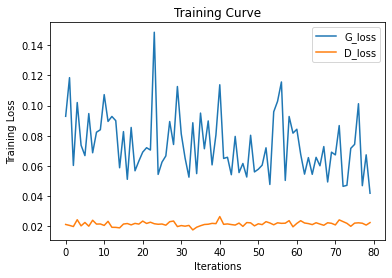

In [ ]:
#train_GAN(G_A2B, G_B2A, D_A, D_B, train_data, lr=0.0001, num_epochs=5, batch_size=32
img_list_A, img_list_B = train_GAN(genA2B, genB2A, disGA, disGB, utk_train_loader, lr=0.0005, num_epochs = 80, batch_size = 32)

In [ ]:
#model save path
MODEL_SAVE_PATH = "/content/gdrive/MyDrive/APS360_project/saved_model/"
torch.save(genA2B.state_dict(), MODEL_SAVE_PATH+"GAN_A2B2.pth")
torch.save(genB2A.state_dict(), MODEL_SAVE_PATH+"GAN_B2A2.pth")
torch.save(disGA.state_dict(), MODEL_SAVE_PATH+"GAN_DA2.pth")
torch.save(disGB.state_dict(), MODEL_SAVE_PATH+"GAN_DB2.pth")

In [ ]:
# capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list_A]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [ ]:
# capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list_B]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [ ]:
batch_size = 32
utk_transform = transforms.Compose([transforms.Resize((224, 224)),
                                transforms.ToTensor()])
                                #transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))])

In [ ]:
utk_train_path = "/content/gdrive/MyDrive/APS360_project/new_crop_img/GAN_cropped/train"
utk_train_data = torchvision.datasets.ImageFolder(root = utk_train_path, transform = utk_transform)

In [ ]:
utk_test, utk_train = torch.utils.data.random_split(utk_train_data, [8280, 1500], generator=torch.Generator().manual_seed(15))

In [ ]:
utk_test_loader = torch.utils.data.DataLoader(utk_test, batch_size=batch_size,
                                                num_workers=2, shuffle = True)

torch.Size([25, 3, 224, 224])
torch.Size([7, 3, 224, 224])
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ff68d7eb9e0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1324, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py", line 1297, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/usr/lib/python3.7/multiprocessing/process.py", line 140, in join
    res = self._popen.wait(timeout)
  File "/usr/lib/python3.7/multiprocessing/popen_fork.py", line 45, in wait
    if not wait([self.sentinel], timeout):
  File "/usr/lib/python3.7/multiprocessing/connection.py", line 921, in wait
    ready = selector.select(timeout)
  File "/usr/lib/python3.7/selectors.py", line 415, in select
    fd_event_list = self._selector.poll(timeout)
KeyboardInterrupt: 


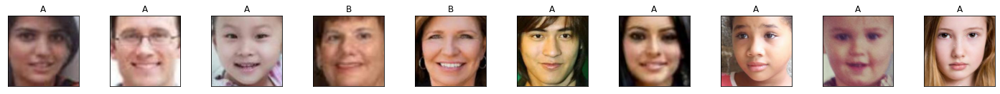

In [ ]:
#display some of the images
fig = plt.figure(figsize=(25,4))
G_A = None
G_B = None
classes = ["A", "B"]

for i, (images, labels) in enumerate(utk_test_loader):
  images = images*2-1
  images = images.numpy()
  if (i<1):
    real_A, real_B = [],[]
    idx_A, idx_B = [],[]
            
    idx = 0
    for label in labels:
      #print(label.item())
      if (label.item()==0):
        idx_A.append(idx)
      else:
        idx_B.append(idx)
      idx += 1

    for idx in idx_A:
      real_A.append(images[idx])
            
    for idx in idx_B:
      real_B.append(images[idx])

    real_A = torch.tensor(real_A)
    real_B = torch.tensor(real_B)

    print(real_A.shape)
    print(real_B.shape)

    #############################################
    #To Enable GPU Usage
    if use_cuda and torch.cuda.is_available():
        real_A = real_A.cuda()
        real_B = real_B.cuda()
    #############################################

    G_A = genA2B(real_A)
    G_B = genB2A(real_B)

    G_A = G_A.detach().cpu()
    G_B = G_B.detach().cpu()

    G_A = G_A.numpy()
    G_B = G_B.numpy()

    G_A = (G_A+1)/2
    G_B = (G_B+1)/2
    images = (images+1)/2

    for idx in range(10):
      print(images[idx].shape)
      ax = fig.add_subplot(2, 20/2, idx+1, xticks = [], yticks = [])
      plt.imshow(np.transpose(images[idx], (1,2,0)))
      ax.set_title(classes[labels[idx]])


  else:
    break

In [ ]:
def inverse_normalize(tensor, mean, std):
    for t, m, s in zip(tensor, mean, std):
        t.mul_(s).add_(m)
    return tensor

<Figure size 1800x288 with 0 Axes>

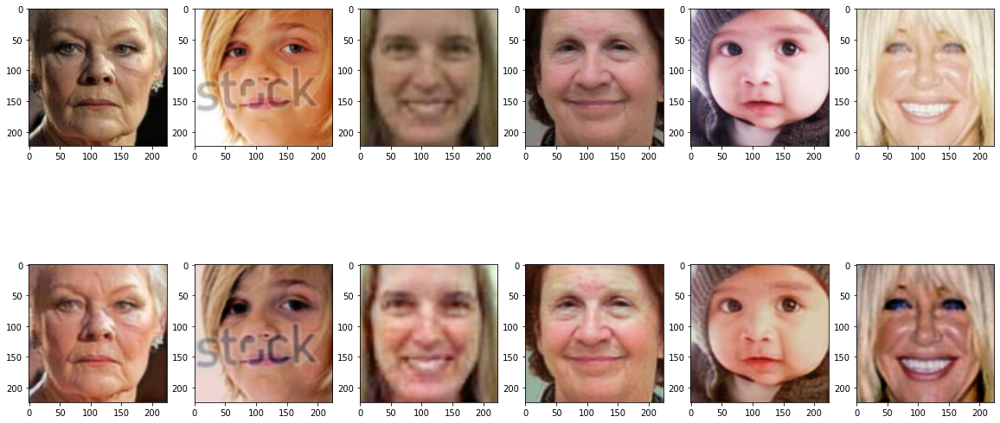

In [ ]:
#display some of the images
fig = plt.figure(figsize=(25,4))
G_A = None
G_B = None
classes = ["A", "B"]
fig, ax = plt.subplots(2, 6, figsize=(20, 10))

for idx, (images, labels) in enumerate(utk_test_loader):
  images = images*2-1
  #images = images.numpy()
  if (idx<1):

    for i in range(6):
      img = images[i]
      img = img.unsqueeze(0)
      if use_cuda and torch.cuda.is_available():
          img = img.cuda()
      aged_face = genA2Bo(img)#genA2B(genB2A(genA2B(img)))
      aged_face = aged_face.detach().cpu()
      img = img.cpu()

      #img = inverse_normalize(img.squeeze(), mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
      #aged_face = inverse_normalize(aged_face.squeeze(), mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))

      aged_face = (aged_face.squeeze().permute(1, 2, 0).numpy() + 1.0) / 2.0
      img = (img.squeeze().permute(1, 2, 0).numpy() + 1.0) / 2.0
      

      ax[0, i].imshow(img)
      ax[1, i].imshow(aged_face)

  else:
    plt.show()
    break

<Figure size 1800x288 with 0 Axes>

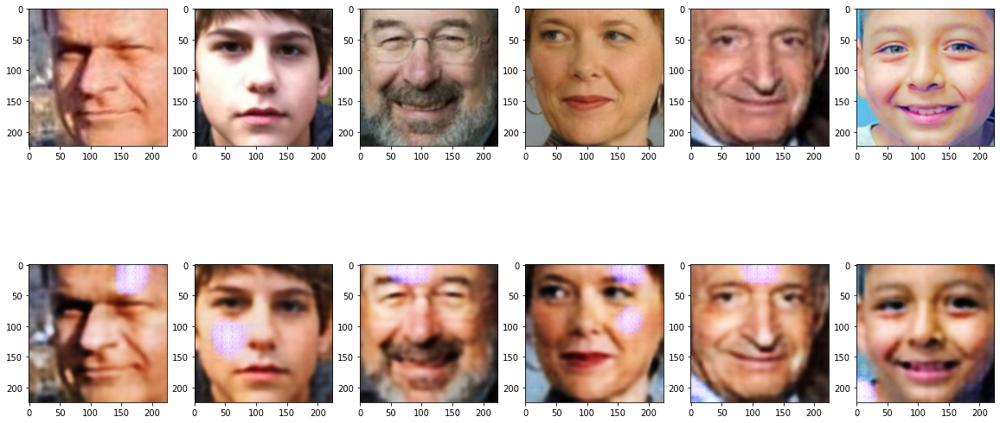

In [ ]:
#display some of the images
fig = plt.figure(figsize=(25,4))
G_A = None
G_B = None
classes = ["A", "B"]
fig, ax = plt.subplots(2, 6, figsize=(20, 10))

for idx, (images, labels) in enumerate(utk_test_loader):
  images = images*2-1
  #images = images.numpy()
  if (idx<1):

    for i in range(6):
      img = images[i]
      img = img.unsqueeze(0)
      if use_cuda and torch.cuda.is_available():
          img = img.cuda()
      aged_face = genB2Ao(img)#genA2B(genB2A(genA2B(img)))
      aged_face = aged_face.detach().cpu()
      img = img.cpu()

      #img = inverse_normalize(img.squeeze(), mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
      #aged_face = inverse_normalize(aged_face.squeeze(), mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))

      aged_face = (aged_face.squeeze().permute(1, 2, 0).numpy() + 1.0) / 2.0
      img = (img.squeeze().permute(1, 2, 0).numpy() + 1.0) / 2.0
      

      ax[0, i].imshow(img)
      ax[1, i].imshow(aged_face)

  else:
    plt.show()
    break

(21, 3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)


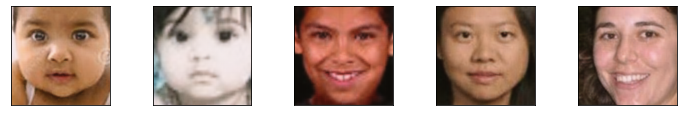

In [ ]:
print(G_A.shape)
fig3 = plt.figure(figsize=(25,4))
G_A = np.clip(G_A, 0, 255)
for idx in range(5):
      #print(images[idx].shape)
      print(G_A[idx].shape)
      ax3 = fig3.add_subplot(2, 20/2, idx+1, xticks = [], yticks = [])
      plt.imshow(np.transpose(G_A[idx], (1,2,0)))
      #ax.set_title(classes[labels[idx]])

(11, 3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)
(3, 224, 224)


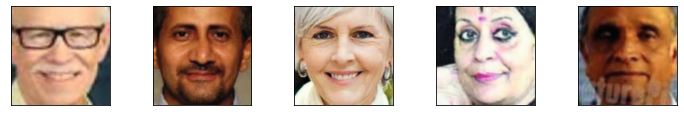

In [ ]:
print(G_B.shape)
fig2 = plt.figure(figsize=(25,4))
G_B = np.clip(G_B, 0, 255)
for idx in range(5):
      #print(images[idx].shape)
      print(G_B[idx].shape)
      ax2 = fig2.add_subplot(2, 20/2, idx+1, xticks = [], yticks = [])
      plt.imshow(np.transpose(G_B[idx], (1,2,0)))
      #ax.set_title(classes[labels[idx]])

In [ ]:
ax = fig.add_subplot(1, 20/2, idx+4, xticks = [], yticks = [])
plt.imshow(np.transpose(img_gen[idx], (1,2,0)))
ax.set_title(classes[new_labels[idx]])

In [ ]:
batch_size = 32
transform = transforms.Compose([transforms.Resize((224, 224)),
                                transforms.CenterCrop((135,135)),
                                transforms.Resize((224, 224)),
                                transforms.ToTensor(),
                                transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
                                ])

In [ ]:
train_path = '/content/gdrive/MyDrive/APS360_project/wiki_processed/train'
test_path = '/content/gdrive/MyDrive/APS360_project/wiki_processed/test'
validation_path = "/content/gdrive/MyDrive/APS360_project/wiki_processed/validation"

train_data_male = torchvision.datasets.ImageFolder(root = train_path+"/male", transform = transform)
test_data_male = torchvision.datasets.ImageFolder(root = test_path+"/male", transform = transform)
validation_data_male = torchvision.datasets.ImageFolder(root = validation_path+"/male", transform = transform)

In [ ]:
#load the images
train_loader_male = torch.utils.data.DataLoader(train_data_male, batch_size=batch_size,
                                                num_workers=2, shuffle = True)

test_loader_male = torch.utils.data.DataLoader(test_data_male, batch_size=batch_size,
                                                num_workers=2, shuffle = True)

validation_loader_male = torch.utils.data.DataLoader(validation_data_male, batch_size=batch_size,
                                                num_workers=2, shuffle = True)

In [ ]:
# create the models 
genA2Bx = Generator(ngf, n_residual_blocks=2)
genB2Ax = Generator(ngf, n_residual_blocks=2)
disGAx = Discriminator(ndf)
disGBx = Discriminator(ndf)

In [ ]:
def train_Wiki(G_A2B, G_B2A, D_A, D_B, train_data, lr=0.0001, num_epochs=5, batch_size=32):

    #############################################
    #To Enable GPU Usage
    if use_cuda and torch.cuda.is_available():
        G_A2B = G_A2B.cuda()
        G_B2A = G_B2A.cuda()
        D_A = D_A.cuda()
        D_B = D_B.cuda()
    #############################################

    # Initialize BCELoss function
    criterion_BCE = nn.BCELoss()
    criterion_L1 = nn.L1Loss()
    criterion_MSE = nn.MSELoss()

    #############################################
    #To Enable GPU Usage
    if use_cuda and torch.cuda.is_available():
        criterion_BCE = criterion_BCE.cuda()
        criterion_L1 = criterion_L1.cuda()
        criterion_MSE = criterion_MSE.cuda()
    #############################################

    epochs, G_losses, D_losses = [],[],[]
    img_list_A, img_list_B = [],[]

    # Create batch of latent vectors that we will use to visualize
    #  the progression of the generator
    fixed_noise = torch.randn(ngf, 50, 1, 1)

    # Setup Adam optimizers for both G and D
    optimizer_G = optim.Adam(itertools.chain(G_A2B.parameters(), G_B2A.parameters()), lr=lr, betas=(0.5, 0.999))
    optimizer_D = optim.Adam(itertools.chain(D_A.parameters(), D_B.parameters()), lr=lr, betas=(0.5, 0.999))

    print("Training start:")
    start_time = time.time()

    for epoch in range(num_epochs):
        for i,(real_imgs, labels) in enumerate(train_data):
            real_A, real_B = [],[]
            idx_A, idx_B = [],[]

            # rescale images to range -1 to 1
            real_imgs = real_imgs*2 - 1
            
            idx = 0
            for label in labels:
                #print(label.item())
                if (label.item()<=4):
                  idx_A.append(idx)
                else:
                  idx_B.append(idx)
                idx += 1

            if(len(idx_A)==0 or len(idx_B)==0):
              continue

            for idx in idx_A:
              real_A.append(real_imgs[idx].numpy())
            
            for idx in idx_B:
              real_B.append(real_imgs[idx].numpy())

            real_A = torch.tensor(real_A)
            real_B = torch.tensor(real_B)

            #print(real_A.shape)
            #print(real_B.shape)

            #############################################
            #To Enable GPU Usage
            if use_cuda and torch.cuda.is_available():
                real_A = real_A.cuda()
                real_B = real_B.cuda()
            #############################################

            same_B = G_A2B(real_B)
            loss_identity_B = criterion_L1(same_B, real_B) * identity_weight

            # G_B2A(A) should equal A if real A is fed
            same_A = G_B2A(real_A)
            loss_identity_A = criterion_L1(same_A, real_A) * identity_weight

            # GAN loss
            fake_B = G_A2B(real_A)
            pred_fake_B = D_B(fake_B)
            loss_GAN_A2B = criterion_MSE(pred_fake_B, torch.ones(pred_fake_B.shape).type_as(pred_fake_B)) * adv_weight

            fake_A = G_B2A(real_B)
            pred_fake_A = D_A(fake_A)
            loss_GAN_B2A = criterion_MSE(pred_fake_A, torch.ones(pred_fake_A.shape).type_as(pred_fake_A)) * adv_weight

            # Cycle loss
            recovered_A = G_B2A(fake_B)
            loss_cycle_ABA = criterion_L1(recovered_A, real_A) * cycle_weight

            recovered_B = G_A2B(fake_A)
            loss_cycle_BAB = criterion_L1(recovered_B, real_B) * cycle_weight

            # Total loss
            g_loss = loss_identity_A + loss_identity_B + loss_GAN_A2B + loss_GAN_B2A + loss_cycle_ABA + loss_cycle_BAB
            g_loss.backward()
            optimizer_G.step()
            optimizer_G.zero_grad()

            # Real loss
            pred_real = D_A(real_A)
            loss_D_real = criterion_MSE(pred_real, torch.ones(pred_real.shape).type_as(pred_real))

            # Fake loss
            pred_fake_A = D_A(fake_A.detach())
            loss_D_fake = criterion_MSE(pred_fake_A, torch.zeros(pred_fake_A.shape).type_as(pred_fake_A))

            # Total loss
            loss_D_A = (loss_D_real + loss_D_fake) * 0.5

            # Real loss
            pred_real = D_B(real_B)
            loss_D_real = criterion_MSE(pred_real, torch.ones(pred_real.shape).type_as(pred_real))

            # Fake loss
            pred_fake_B = D_B(fake_B.detach())
            loss_D_fake = criterion_MSE(pred_fake_B, torch.zeros(pred_fake_B.shape).type_as(pred_fake_B))

            # Total loss
            loss_D_B = (loss_D_real + loss_D_fake) * 0.5
            d_loss = loss_D_A + loss_D_B
            d_loss.backward()
            optimizer_D.step()
            optimizer_D.zero_grad()
        
        epochs.append(epoch)
        G_losses.append(g_loss/32)
        D_losses.append(d_loss/32)

        print(("Epoch {}: G_losses: {:.4f} | D_losses: {:.4f}").format(epoch + 1,G_losses[-1], D_losses[-1]))

        with torch.no_grad():
            if use_cuda and torch.cuda.is_available():
                #fixed_noise.cuda()
                fake_A = fake_A.detach().cpu()
                fake_B = fake_B.detach().cpu()
                img_list_A.append(vutils.make_grid(fake_A, padding=2, normalize=True))
                img_list_B.append(vutils.make_grid(fake_A, padding=2, normalize=True))
            else:
                fake_A = fake_A.detach()
                fake_B = fake_B.detach()
                img_list_A.append(vutils.make_grid(fake_A, padding=2, normalize=True))
                img_list_B.append(vutils.make_grid(fake_A, padding=2, normalize=True))

    print('Finished Training')
    end_time = time.time()
    elapsed_time = end_time - start_time
    print("Total time elapsed: {:.5f} seconds".format(elapsed_time))

    plt.title("Training Curve")
    plt.plot(G_losses, label="G_loss")
    plt.plot(D_losses, label="D_loss")
    plt.xlabel("Iterations")
    plt.ylabel("Training Loss")
    plt.legend(loc='best')
    plt.show()

    return img_list_A, img_list_B

Training start:
Epoch 1: G_losses: 0.6419 | D_losses: 0.0200
Epoch 2: G_losses: 0.5564 | D_losses: 0.0208
Epoch 3: G_losses: 0.5745 | D_losses: 0.0189
Epoch 4: G_losses: 0.8963 | D_losses: 0.0217
Epoch 5: G_losses: 0.6607 | D_losses: 0.0205
Epoch 6: G_losses: 0.9990 | D_losses: 0.0190
Epoch 7: G_losses: 0.5869 | D_losses: 0.0202
Epoch 8: G_losses: 0.5929 | D_losses: 0.0204
Finished Training
Total time elapsed: 1965.42752 seconds


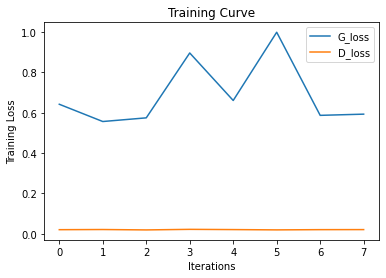

In [ ]:
#train_GAN(G_A2B, G_B2A, D_A, D_B, train_data, lr=0.0001, num_epochs=5, batch_size=32
img_list_A, img_list_B = train_Wiki(genA2Bx, genB2Ax, disGAx, disGBx, train_loader_male, lr=0.0002, num_epochs = 8, batch_size = 32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 1800x288 with 0 Axes>

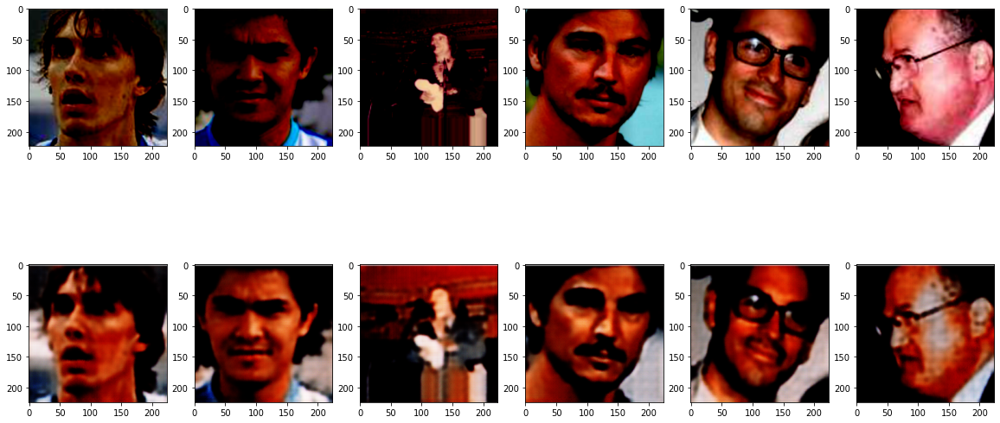

In [ ]:
#display some of the images
fig = plt.figure(figsize=(25,4))
G_A = None
G_B = None
classes = ["A", "B"]
fig, ax = plt.subplots(2, 6, figsize=(20, 10))

for idx, (images, labels) in enumerate(test_loader_male):
  images = images*2-1
  #images = images.numpy()
  if (idx<1):

    for i in range(6):
      img = images[i]
      img = img.unsqueeze(0)
      if use_cuda and torch.cuda.is_available():
          img = img.cuda()
      aged_face = genA2Bx(img)#genA2B(genB2A(genA2B(img)))
      aged_face = aged_face.detach().cpu()
      img = img.cpu()

      img = (img + 1.0)/2
      aged_face = (aged_face + 1.0)/2

      img = inverse_normalize(img.squeeze().permute(1, 2, 0), mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
      aged_face = inverse_normalize(aged_face.squeeze().permute(1, 2, 0), mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))

      aged_face = aged_face.numpy()
      img = img.numpy()
      

      ax[0, i].imshow(img)
      ax[1, i].imshow(aged_face)

  else:
    plt.show()
    break

In [ ]:
#utk_train_loader_male

In [ ]:
inst_transform = transforms.Compose([
            transforms.RandomHorizontalFlip(),
            transforms.Resize((224 + 30, 224 + 30)),
            transforms.RandomCrop(224)#,
            #transforms.ToTensor()#,
            #transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
        ])

In [56]:
import random
from scipy.interpolate import make_interp_spline, BSpline
def train_gender(G_A2B, G_B2A, D_A, D_B, train_data, lr=0.0001, num_epochs=5, batch_size=32):

    #############################################
    #To Enable GPU Usage
    if use_cuda and torch.cuda.is_available():
        G_A2B = G_A2B.cuda()
        G_B2A = G_B2A.cuda()
        D_A = D_A.cuda()
        D_B = D_B.cuda()
    #############################################

    # Initialize BCELoss function
    criterion_BCE = nn.BCELoss()
    criterion_L1 = nn.L1Loss()
    criterion_MSE = nn.MSELoss()

    #############################################
    #To Enable GPU Usage
    if use_cuda and torch.cuda.is_available():
        criterion_BCE = criterion_BCE.cuda()
        criterion_L1 = criterion_L1.cuda()
        criterion_MSE = criterion_MSE.cuda()
    #############################################

    epochs, G_losses, D_losses = [],[],[]
    img_list_A, img_list_B = [],[]

    # Create batch of latent vectors that we will use to visualize
    #  the progression of the generator
    fixed_noise = torch.randn(ngf, 50, 1, 1)

    # Setup Adam optimizers for both G and D
    optimizer_G = optim.Adam(itertools.chain(G_A2B.parameters(), G_B2A.parameters()), lr=lr, betas=(0.5, 0.999))
    optimizer_D = optim.Adam(itertools.chain(D_A.parameters(), D_B.parameters()), lr=lr, betas=(0.5, 0.999))

    print("Training start:")
    start_time = time.time()

    last_A = None
    last_B = None

    for epoch in range(num_epochs):
        for i,(real_imgs, labels) in enumerate(train_data):
            real_A, real_B = [],[]
            idx_A, idx_B = [],[]

            # rescale images to range -1 to 1
            real_imgs = real_imgs*2 - 1
            
            idx = 0
            for label in labels:
                #print(label.item())
                if (label.item()<=5):
                  idx_A.append(idx)
                else:
                  idx_B.append(idx)
                idx += 1

            if len(idx_A)==0:
                continue
            elif len(idx_B)==0:
                continue

            for idx in idx_A:
                last_A = real_imgs[idx]
                real_A.append(real_imgs[idx].numpy())

            '''
            if (len(idx_A)==0):
                for temp in range(32):
                    #last_A = inst_transform(last_A)
                    real_A.append(last_A.numpy())
            else:
                for temp in range(32-len(idx_A)):
                    rand_num = random.randint(0,len(idx_A)-1)
                    curr = real_imgs[rand_num]
                    #curr = inst_transform(curr)
                    real_A.append(curr.numpy())
           '''

            for idx in idx_B:
                last_B = real_imgs[idx]
                real_B.append(real_imgs[idx].numpy())

            real_A = torch.tensor(real_A)
            real_B = torch.tensor(real_B)

            #print(real_A.shape)
            #print(real_B.shape)

            #############################################
            #To Enable GPU Usage
            if use_cuda and torch.cuda.is_available():
                real_A = real_A.cuda()
                real_B = real_B.cuda()
            #############################################

            same_B = G_A2B(real_B)
            loss_identity_B = criterion_L1(same_B, real_B) * identity_weight

            # G_B2A(A) should equal A if real A is fed
            same_A = G_B2A(real_A)
            loss_identity_A = criterion_L1(same_A, real_A) * identity_weight

            # GAN loss
            fake_B = G_A2B(real_A)
            pred_fake_B = D_B(fake_B)
            loss_GAN_A2B = criterion_MSE(pred_fake_B, torch.ones(pred_fake_B.shape).type_as(pred_fake_B)) * adv_weight

            fake_A = G_B2A(real_B)
            pred_fake_A = D_A(fake_A)
            loss_GAN_B2A = criterion_MSE(pred_fake_A, torch.ones(pred_fake_A.shape).type_as(pred_fake_A)) * adv_weight

            # Cycle loss
            recovered_A = G_B2A(fake_B)
            loss_cycle_ABA = criterion_L1(recovered_A, real_A) * cycle_weight

            recovered_B = G_A2B(fake_A)
            loss_cycle_BAB = criterion_L1(recovered_B, real_B) * cycle_weight

            # Total loss
            g_loss = loss_identity_A + loss_identity_B + loss_GAN_A2B + loss_GAN_B2A + loss_cycle_ABA + loss_cycle_BAB
            g_loss.backward()
            optimizer_G.step()
            optimizer_G.zero_grad()

            # Real loss
            pred_real = D_A(real_A)
            loss_D_real = criterion_MSE(pred_real, torch.ones(pred_real.shape).type_as(pred_real))

            # Fake loss
            pred_fake_A = D_A(fake_A.detach())
            loss_D_fake = criterion_MSE(pred_fake_A, torch.zeros(pred_fake_A.shape).type_as(pred_fake_A))

            # Total loss
            loss_D_A = (loss_D_real + loss_D_fake) * 0.5

            # Real loss
            pred_real = D_B(real_B)
            loss_D_real = criterion_MSE(pred_real, torch.ones(pred_real.shape).type_as(pred_real))

            # Fake loss
            pred_fake_B = D_B(fake_B.detach())
            loss_D_fake = criterion_MSE(pred_fake_B, torch.zeros(pred_fake_B.shape).type_as(pred_fake_B))

            # Total loss
            loss_D_B = (loss_D_real + loss_D_fake) * 0.5
            d_loss = loss_D_A + loss_D_B
            d_loss.backward()
            optimizer_D.step()
            optimizer_D.zero_grad()
        
        epochs.append(epoch)
        G_losses.append(g_loss/32)
        D_losses.append(d_loss/32)

        print(("Epoch {}: G_losses: {:.4f} | D_losses: {:.4f}").format(epoch + 1,G_losses[-1], D_losses[-1]))

        with torch.no_grad():
            if use_cuda and torch.cuda.is_available():
                #fixed_noise.cuda()
                fake_A = fake_A.detach().cpu()
                fake_B = fake_B.detach().cpu()
                img_list_A.append(vutils.make_grid(fake_A, padding=2, normalize=True))
                img_list_B.append(vutils.make_grid(fake_A, padding=2, normalize=True))
            else:
                fake_A = fake_A.detach()
                fake_B = fake_B.detach()
                img_list_A.append(vutils.make_grid(fake_A, padding=2, normalize=True))
                img_list_B.append(vutils.make_grid(fake_A, padding=2, normalize=True))

    print('Finished Training')
    end_time = time.time()
    elapsed_time = end_time - start_time
    print("Total time elapsed: {:.5f} seconds".format(elapsed_time))

    plt.title("Training Curve")
    plt.plot(G_losses, label="G_loss")
    plt.plot(D_losses, label="D_loss")
    plt.xlabel("Iterations")
    plt.ylabel("Training Loss")
    plt.legend(loc='best')
    plt.show()

    return img_list_A, img_list_B

In [48]:
# create the models 
genA2Bm = Generator(ngf, n_residual_blocks=3)
genB2Am = Generator(ngf, n_residual_blocks=3)
disGAm = Discriminator(ndf)
disGBm = Discriminator(ndf)

In [49]:
#train_GAN(G_A2B, G_B2A, D_A, D_B, train_data, lr=0.0001, num_epochs=5, batch_size=32
img_list_A, img_list_B = train_gender(genA2Bm, genB2Am, disGAm, disGBm, utk_train_loader_male, lr=0.0002, num_epochs = 20, batch_size = 32)

Training start:


KeyboardInterrupt: ignored

<Figure size 1800x288 with 0 Axes>

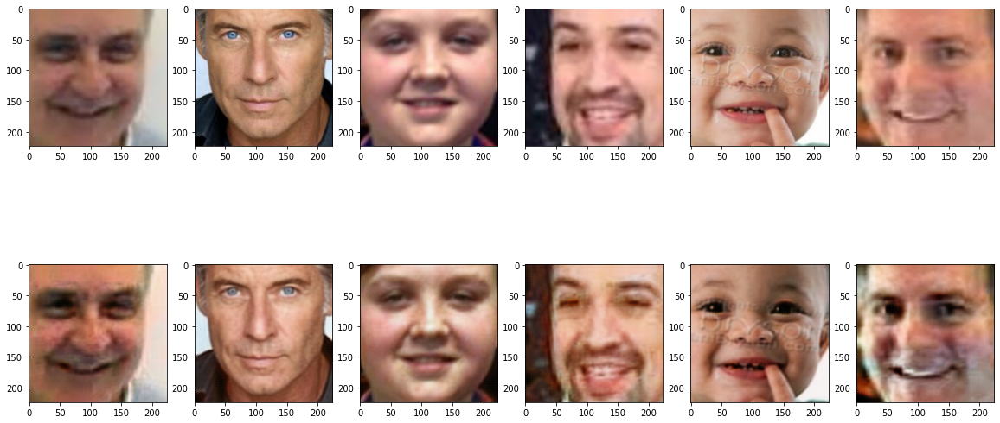

In [ ]:
#display some of the images
fig = plt.figure(figsize=(25,4))
G_A = None
G_B = None
classes = ["A", "B"]
fig, ax = plt.subplots(2, 6, figsize=(20, 10))

for idx, (images, labels) in enumerate(utk_test_loader_male):
  images = images*2-1
  #images = images.numpy()
  if (idx<1):

    for i in range(6):
      img = images[i]
      img = img.unsqueeze(0)
      if use_cuda and torch.cuda.is_available():
          img = img.cuda()
      aged_face = genA2Bm(img)#genA2Bm(genB2Am(genA2Bm(img)))
      aged_face = aged_face.detach().cpu()
      img = img.cpu()

      img = (img + 1.0)/2
      aged_face = (aged_face + 1.0)/2

      #img = inverse_normalize(img.squeeze().permute(1, 2, 0), mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
      #aged_face = inverse_normalize(aged_face.squeeze().permute(1, 2, 0), mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))

      aged_face = aged_face.squeeze().permute(1, 2, 0).numpy()
      img = img.squeeze().permute(1, 2, 0).numpy()
      

      ax[0, i].imshow(img)
      ax[1, i].imshow(aged_face)

  else:
    plt.show()
    break

<Figure size 1800x288 with 0 Axes>

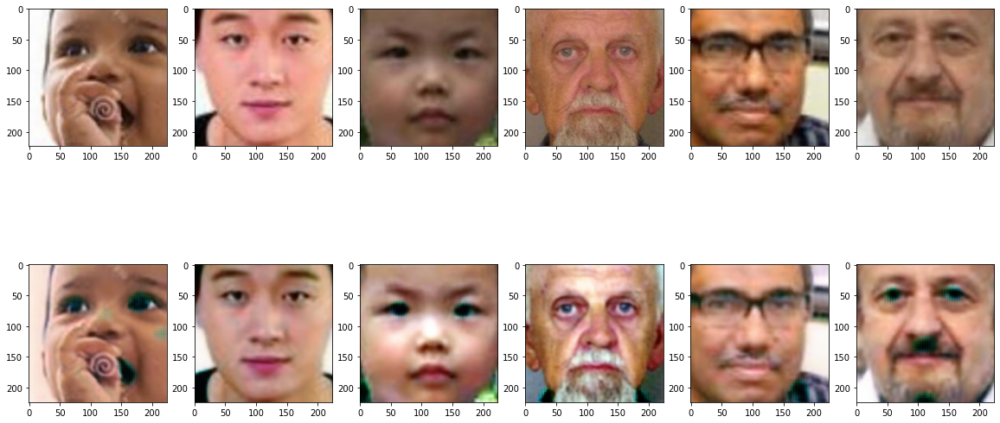

In [ ]:
#display some of the images
fig = plt.figure(figsize=(25,4))
G_A = None
G_B = None
classes = ["A", "B"]
fig, ax = plt.subplots(2, 6, figsize=(20, 10))

for idx, (images, labels) in enumerate(utk_test_loader_male):
  images = images*2-1
  #images = images.numpy()
  if (idx<1):

    for i in range(6):
      img = images[i]
      img = img.unsqueeze(0)
      if use_cuda and torch.cuda.is_available():
          img = img.cuda()
      aged_face = genB2Am(img)#genA2Bm(genB2Am(genA2Bm(img)))
      aged_face = aged_face.detach().cpu()
      img = img.cpu()

      img = (img + 1.0)/2
      aged_face = (aged_face + 1.0)/2

      #img = inverse_normalize(img.squeeze().permute(1, 2, 0), mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
      #aged_face = inverse_normalize(aged_face.squeeze().permute(1, 2, 0), mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))

      aged_face = aged_face.squeeze().permute(1, 2, 0).numpy()
      img = img.squeeze().permute(1, 2, 0).numpy()
      

      ax[0, i].imshow(img)
      ax[1, i].imshow(aged_face)

  else:
    plt.show()
    break

In [52]:
# create the models 
genA2Bt = Generator(ngf, n_residual_blocks=4)
genB2At = Generator(ngf, n_residual_blocks=4)
disGAt = Discriminator(ndf)
disGBt = Discriminator(ndf)

In [57]:
#train_GAN(G_A2B, G_B2A, D_A, D_B, train_data, lr=0.0001, num_epochs=5, batch_size=32
#train_loader = utk_train_loader_female + utk_train_loader_male
img_list_A, img_list_B = train_gender(genA2Bt, genB2At, disGAt, disGBt, utk_train_loader, lr=0.0001, num_epochs = 40, batch_size = 32)

Training start:
Epoch 1: G_losses: 0.0825 | D_losses: 0.0210
Epoch 2: G_losses: 0.0644 | D_losses: 0.0225
Epoch 3: G_losses: 0.0825 | D_losses: 0.0210
Epoch 4: G_losses: 0.0775 | D_losses: 0.0213
Epoch 5: G_losses: 0.1086 | D_losses: 0.0221
Epoch 6: G_losses: 0.0613 | D_losses: 0.0220
Epoch 7: G_losses: 0.0521 | D_losses: 0.0212


KeyboardInterrupt: ignored

<Figure size 1800x288 with 0 Axes>

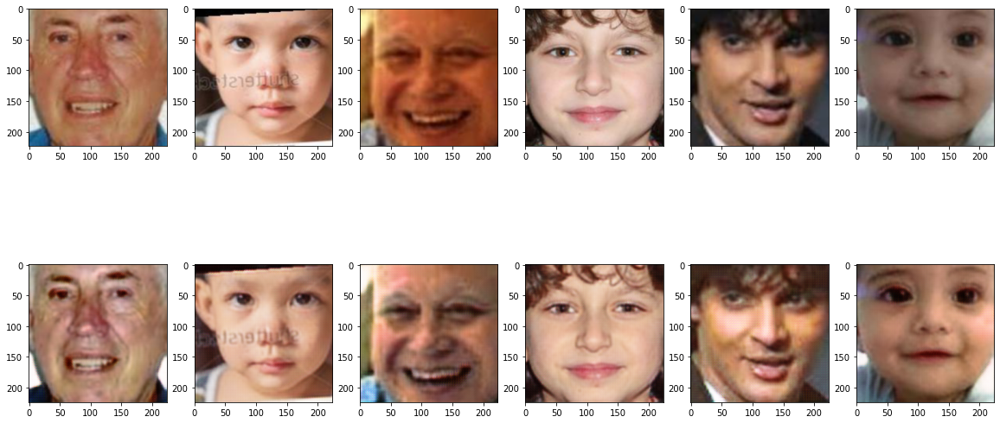

In [24]:
#display some of the images
fig = plt.figure(figsize=(25,4))
G_A = None
G_B = None
classes = ["A", "B"]
fig, ax = plt.subplots(2, 6, figsize=(20, 10))

for idx, (images, labels) in enumerate(utk_test_loader_male):
  images = images*2-1
  #images = images.numpy()
  if (idx<1):

    for i in range(6):
      img = images[i]
      img = img.unsqueeze(0)
      if use_cuda and torch.cuda.is_available():
          img = img.cuda()
      aged_face = genA2Bt(img)
      aged_face = aged_face.detach().cpu()
      img = img.cpu()

      img = (img + 1.0)/2
      aged_face = (aged_face + 1.0)/2

      #img = inverse_normalize(img.squeeze().permute(1, 2, 0), mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
      #aged_face = inverse_normalize(aged_face.squeeze().permute(1, 2, 0), mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))

      aged_face = aged_face.squeeze().permute(1, 2, 0).numpy()
      img = img.squeeze().permute(1, 2, 0).numpy()
      

      ax[0, i].imshow(img)
      ax[1, i].imshow(aged_face)

  else:
    plt.show()
    break

<Figure size 1800x288 with 0 Axes>

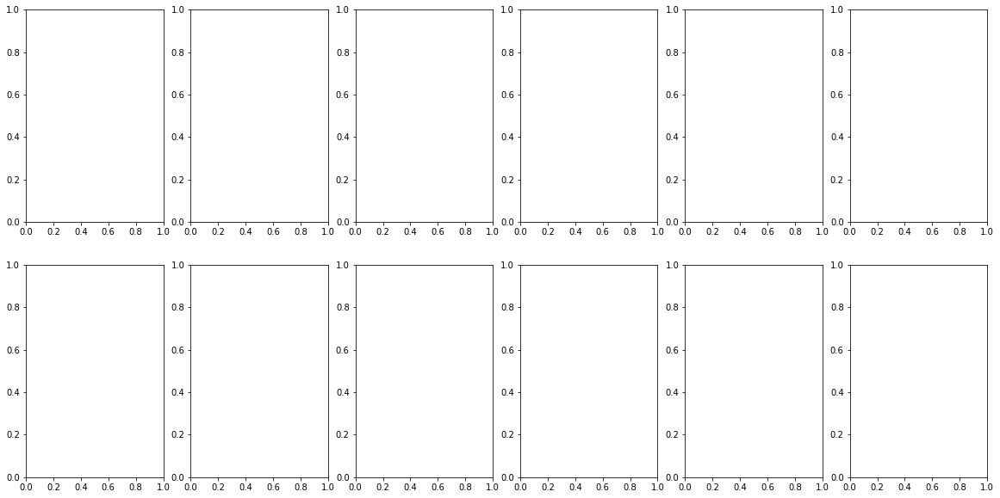

In [33]:
#display some of the images
fig = plt.figure(figsize=(25,4))
G_A = None
G_B = None
classes = ["A", "B"]
fig, ax = plt.subplots(2, 6, figsize=(20, 10))

get_img = None

for idx, (images, labels) in enumerate(utk_test_loader_male):
  images = images*2-1
  #images = images.numpy()
  if (idx<1):

    for i in range(6):
      get_img = images
      break
      img = images[i]
      img = img.unsqueeze(0)
      if use_cuda and torch.cuda.is_available():
          img = img.cuda()
      aged_face = genA2Bt(img)
      aged_face = aged_face.detach().cpu()
      img = img.cpu()

      img = (img + 1.0)/2
      aged_face = (aged_face + 1.0)/2

      #img = inverse_normalize(img.squeeze().permute(1, 2, 0), mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
      #aged_face = inverse_normalize(aged_face.squeeze().permute(1, 2, 0), mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))

      aged_face = aged_face.squeeze().permute(1, 2, 0).numpy()
      img = img.squeeze().permute(1, 2, 0).numpy()
      

      ax[0, i].imshow(img)
      ax[1, i].imshow(aged_face)

  else:
    plt.show()
    break

In [10]:
newGAN = Generator(ngf, 1)
GANa2b = torch.load("/content/gdrive/MyDrive/APS360_project/saved_model/GAN_A2B.pth")
newGAN.load_state_dict(GANa2b)
newGAN.eval()

Generator(
  (model): Sequential(
    (0): ReflectionPad2d((3, 3, 3, 3))
    (1): Conv2d(3, 32, kernel_size=(7, 7), stride=(1, 1))
    (2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): ReLU()
    (4): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU()
    (10): ResidualBlock(
      (conv_block): Sequential(
        (0): ReflectionPad2d((1, 1, 1, 1))
        (1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1))
        (2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (3): ReLU()
        (4): ReflectionPad2d((1, 1, 1, 1))
        (5): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1))
        (6): Ba

In [34]:
print(get_img.shape)

torch.Size([16, 3, 224, 224])


In [37]:
convt = newGAN
y = newGAN(get_img)
y.shape

torch.Size([16, 3, 224, 224])

In [32]:
newGAN.features(get_img)

AttributeError: ignored

In [38]:
y = y.detach().numpy()
y = (y - y.min()) / (y.max() - y.min())
y.shape

(16, 3, 224, 224)

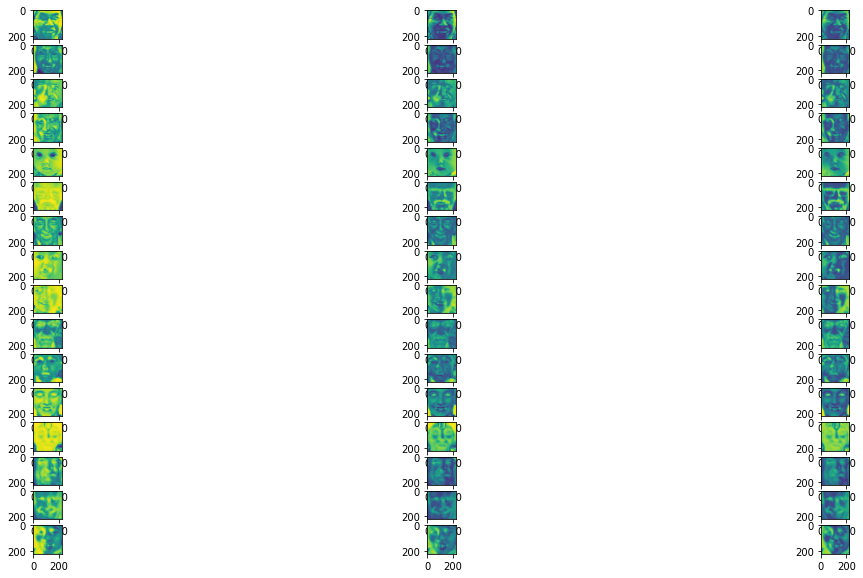

In [46]:
fig, ax = plt.subplots(16, 3, figsize=(20, 10))
for j in range(16):
  for i in range(3):
      ax[j, i].imshow(y[j, i])